In [15]:
! pip install geopy

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# For preprocessing and modeling
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier

# For Deep Learning
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

from lime import lime_tabular

# import my custom function from utils notebook
import import_ipynb
import my_utils

import importlib
importlib.reload(my_utils)
from tqdm import tqdm
from my_utils import *

pd.set_option('display.max_columns', None)

## General Data Exploration

In [17]:
data, test = get_original_training_data(light=True)


print(data.shape)
print(test.shape)

df = data


print(data.shape)
print(test.shape)

# Display basic information
print(data.info())
print(data.head())

train shape  (340000, 22)
test shape  (60000, 22)
(340000, 22)
(60000, 22)
(340000, 22)
(60000, 22)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340000 entries, 173332 to 513331
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   trans_date_trans_time  340000 non-null  object 
 1   cc_num                 340000 non-null  int64  
 2   merchant               340000 non-null  object 
 3   category               340000 non-null  object 
 4   amt                    340000 non-null  float64
 5   first                  340000 non-null  object 
 6   last                   340000 non-null  object 
 7   gender                 340000 non-null  object 
 8   street                 340000 non-null  object 
 9   city                   340000 non-null  object 
 10  state                  340000 non-null  object 
 11  zip                    340000 non-null  int64  
 12  lat                    340000 non-nul

In [18]:
# Check for missing values
print(data.isnull().sum())

# Summary statistics for numerical columns
print(data.describe())

# Check unique values in categorical columns
categorical_cols = ['merchant', 'category', 'gender', 'city', 'state', 'job']
for col in categorical_cols:
    print(f"{col}: {data[col].nunique()} unique values")

trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64
             cc_num            amt            zip            lat  \
count  3.400000e+05  340000.000000  340000.000000  340000.000000   
mean   4.161888e+17      69.831486   48746.800132      38.535149   
std    1.307559e+18     157.499387   26927.997015       5.075511   
min    6.041621e+10       1.000000    1257.000000      20.027100   
25%    1.800365e+14       9.650000   26041.000000    

# Column Descriptions

- **trans_date_trans_time**: The timestamp of the transaction.
- **cc_num**: The credit card number used in the transaction (anonymized).
- **merchant**: The merchant involved in the transaction.
- **category**: The category of the purchase (e.g., personal_care, groceries).
- **amt**: The transaction amount in dollars.
- **first**: The first name of the credit card holder.
- **last**: The last name of the credit card holder.
- **gender**: The gender of the cardholder (`M` for Male, `F` for Female).
- **street**: The street address of the cardholder.
- **city**: The city where the cardholder resides.
- **state**: The state where the cardholder resides.
- **zip**: The zip code of the cardholder's address.
- **lat**: Latitude of the cardholder's address.
- **long**: Longitude of the cardholder's address.
- **city_pop**: The population of the city where the cardholder resides.
- **job**: The occupation of the cardholder.
- **dob**: The date of birth of the cardholder.
- **trans_num**: A unique identifier for the transaction.
- **unix_time**: Unix timestamp of the transaction.
- **merch_lat**: Latitude of the merchant's location.
- **merch_long**: Longitude of the merchant's location.
- **is_fraud**: Target column indicating if the transaction is fraudulent (`1` for Fraud, `0` for Non-Fraud).


train shape  (340000, 22)
test shape  (60000, 22)


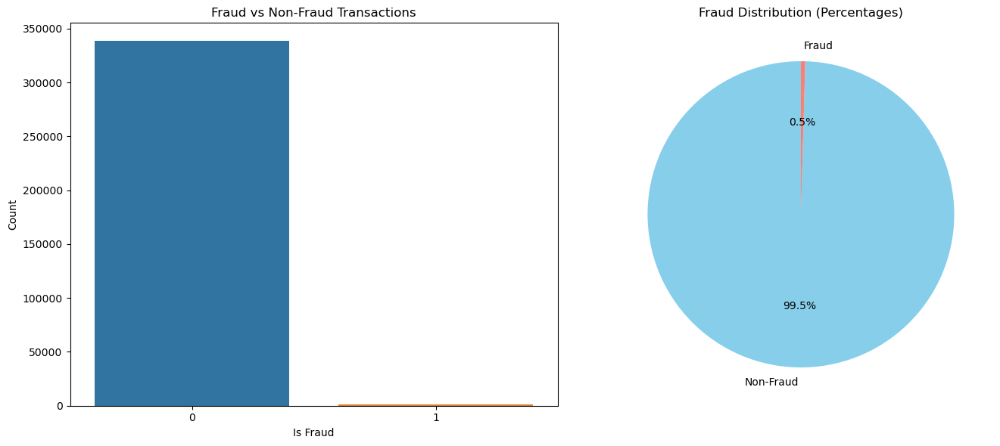

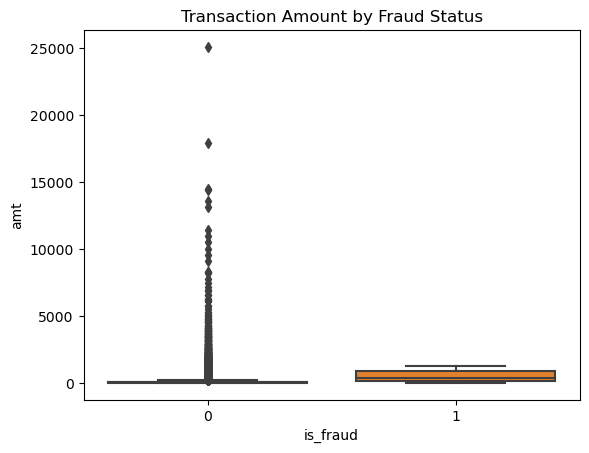

C:\Users\s.crispino\AppData\Local\Temp\ipykernel_8564\519463922.py:34: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr()


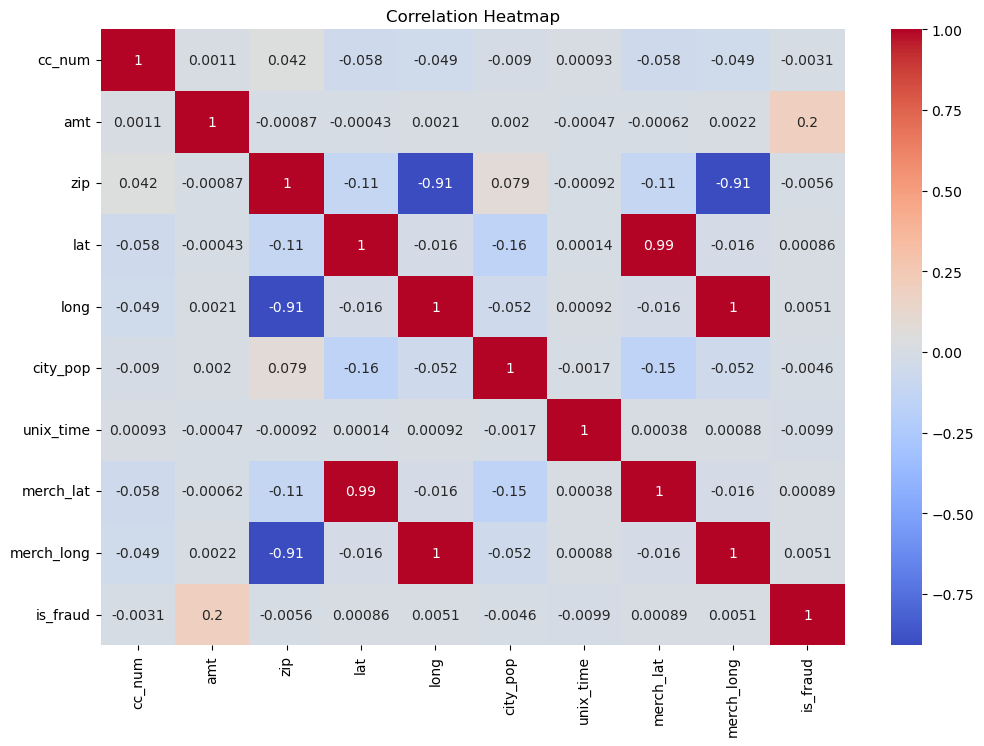

In [19]:
data, test = get_original_training_data(light=True)

# Set up the figure for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Bar plot: Fraud distribution
sns.countplot(x='is_fraud', data=data, ax=axes[0])
axes[0].set_title('Fraud vs Non-Fraud Transactions')
axes[0].set_xlabel('Is Fraud')
axes[0].set_ylabel('Count')

# Pie chart: Fraud distribution with percentages
fraud_counts = data['is_fraud'].value_counts()
fraud_labels = ['Non-Fraud', 'Fraud']  # Labels for pie chart
axes[1].pie(
    fraud_counts,
    labels=fraud_labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=['skyblue', 'salmon']
)
axes[1].set_title('Fraud Distribution (Percentages)')

plt.tight_layout()
plt.show()


# Transaction amount distribution
sns.boxplot(x='is_fraud', y='amt', data=data)
plt.title('Transaction Amount by Fraud Status')
plt.show()

# Explore correlations (numerical data only)
corr_matrix = data.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

train shape  (340000, 22)
test shape  (60000, 22)
Fraud Frequency in Training Data: 0.47%
Fraud Frequency in Validation Data: 0.40%
Fraud Frequency in Test Data: 0.47%


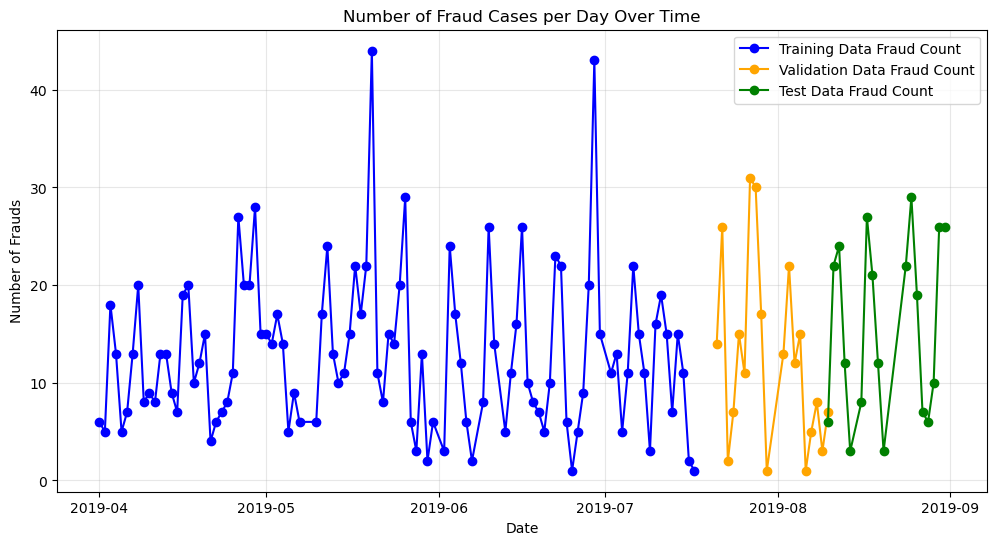

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming `get_original_training_data` is a predefined function
train, test = get_original_training_data()

# Combine train and test datasets
complete_df = pd.concat([train, test])

# Ensure the transaction timestamp is in datetime format
complete_df['trans_date_trans_time'] = pd.to_datetime(complete_df['trans_date_trans_time'])

# Split the dataset into training, validation, and test sets based on time
train_size = int(len(complete_df) * 0.7)
val_size = int(len(complete_df) * 0.15)

train_df = complete_df[:train_size]
val_df = complete_df[train_size:train_size+val_size]
test_df = complete_df[train_size+val_size:]

# Define a function to get daily fraud count for each dataset
def get_daily_fraud_count(df):
    return (
        df[df['is_fraud'] == 1]  # Filter for fraud cases
        .groupby(df['trans_date_trans_time'].dt.date)  # Group by date
        .size()  # Count fraud cases per day
        .reset_index(name='fraud_count')  # Reset index and name the count column
    )

# Get daily fraud counts for each dataset
daily_fraud_train = get_daily_fraud_count(train_df)
daily_fraud_val = get_daily_fraud_count(val_df)
daily_fraud_test = get_daily_fraud_count(test_df)

# Convert the 'trans_date_trans_time' column back to datetime for plotting
daily_fraud_train['trans_date_trans_time'] = pd.to_datetime(daily_fraud_train['trans_date_trans_time'])
daily_fraud_val['trans_date_trans_time'] = pd.to_datetime(daily_fraud_val['trans_date_trans_time'])
daily_fraud_test['trans_date_trans_time'] = pd.to_datetime(daily_fraud_test['trans_date_trans_time'])

# Calculate the frequency of fraud for each dataset
def calculate_fraud_frequency(df):
    total_transactions = len(df)
    total_fraud = df['is_fraud'].sum()
    return (total_fraud / total_transactions) * 100

fraud_freq_train = calculate_fraud_frequency(train_df)
fraud_freq_val = calculate_fraud_frequency(val_df)
fraud_freq_test = calculate_fraud_frequency(test_df)

# Print the fraud frequencies for each dataset
print(f"Fraud Frequency in Training Data: {fraud_freq_train:.2f}%")
print(f"Fraud Frequency in Validation Data: {fraud_freq_val:.2f}%")
print(f"Fraud Frequency in Test Data: {fraud_freq_test:.2f}%")

# Plot the daily fraud count over time for each dataset
plt.figure(figsize=(12, 6))

# Plot for training data
plt.plot(
    daily_fraud_train['trans_date_trans_time'], 
    daily_fraud_train['fraud_count'], 
    marker='o', 
    linestyle='-', 
    color='blue', 
    label='Training Data Fraud Count'
)

# Plot for validation data
plt.plot(
    daily_fraud_val['trans_date_trans_time'], 
    daily_fraud_val['fraud_count'], 
    marker='o', 
    linestyle='-', 
    color='orange', 
    label='Validation Data Fraud Count'
)

# Plot for test data
plt.plot(
    daily_fraud_test['trans_date_trans_time'], 
    daily_fraud_test['fraud_count'], 
    marker='o', 
    linestyle='-', 
    color='green', 
    label='Test Data Fraud Count'
)

# Title and labels
plt.title('Number of Fraud Cases per Day Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Frauds')
plt.grid(alpha=0.3)
plt.legend()
plt.show()


## Transaction Time Patterns

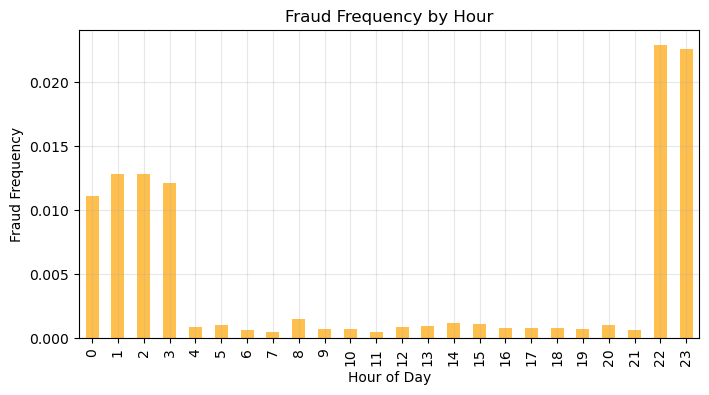

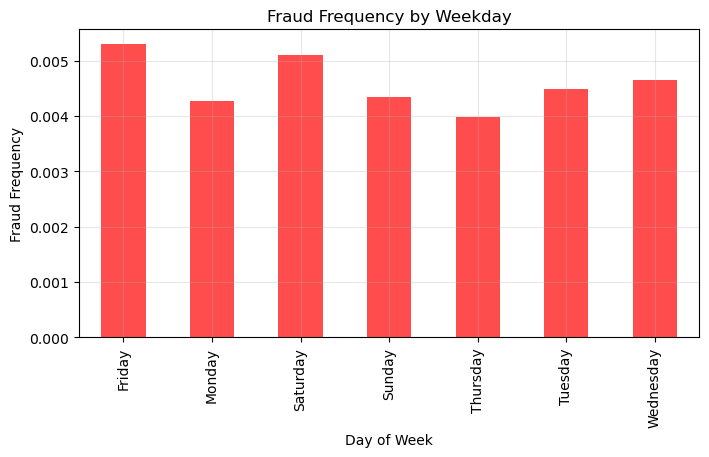

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert the transaction date to a datetime format
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])
df['hour'] = df['trans_date_trans_time'].dt.hour
df['weekday'] = df['trans_date_trans_time'].dt.day_name()

# Calculate the fraud frequency by hour
hourly_fraud_frequency = (
    df[df['is_fraud'] == 1]['hour'].value_counts().sort_index() / df['hour'].value_counts().sort_index()
)

# Hourly Fraud Frequency Plot
plt.figure(figsize=(8, 4))
hourly_fraud_frequency.plot(kind='bar', color='orange', alpha=0.7)
plt.title("Fraud Frequency by Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Fraud Frequency")
plt.grid(alpha=0.3)
plt.show()

# Calculate the fraud frequency by weekday
weekday_fraud_frequency = (
    df[df['is_fraud'] == 1]['weekday'].value_counts().sort_index() / df['weekday'].value_counts().sort_index()
)

# Fraud Frequency by Weekday Plot
plt.figure(figsize=(8, 4))
weekday_fraud_frequency.plot(kind='bar', color='red', alpha=0.7)
plt.title("Fraud Frequency by Weekday")
plt.xlabel("Day of Week")
plt.ylabel("Fraud Frequency")
plt.grid(alpha=0.3)
plt.show()


In [22]:
def create_hourly_fraud_probability(data):
    # Step 1: Ensure the data is sorted by time
    data['hour'] = data['trans_date_trans_time'].dt.hour
    
    data = data.sort_values(by=['hour', 'trans_date_trans_time'])

    # Step 2: Initialize cumulative fraud statistics
    data['hourly_fraud_probability'] = 0.0

    # Step 3: Calculate cumulative stats for each hour group
    hour_groups = data.groupby('hour')

    ## Iterate through each hour group
    for hour, group in tqdm(hour_groups, desc="Processing hours", total=len(hour_groups)):
        # Initialize cumulative counts
        total_count = 0
        fraud_count = 0

        ## Iterate through each transaction of a specific hour group
        for idx, row in group.iterrows():
            # Assign cumulative probability for the current transaction
            if total_count > 0:
                data.at[idx, 'hourly_fraud_probability'] = fraud_count / total_count
            else:
                # Default to global fraud rate for the first transaction in each group
                data.at[idx, 'hourly_fraud_probability'] = data['is_fraud'].mean()

            # Update cumulative counts
            total_count += 1
            fraud_count += row['is_fraud']

    # The feature 'hourly_fraud_probability' is now time-dependent and ready to use
    return data


## Merchant and Category Insights

In [23]:
merchant_fraud_frequency = (df[df['is_fraud'] == 1]['merchant'].value_counts() / df['merchant'].value_counts())
merchant_fraud_frequency_sorted = merchant_fraud_frequency.sort_values(ascending=False)

merchant_fraud_frequency_sorted

fraud_Goyette Inc                    0.025896
fraud_Bogisich-Homenick              0.023952
fraud_Herman, Treutel and Dickens    0.023055
fraud_Little, Gutmann and Lynch      0.022901
fraud_Koelpin and Sons               0.021538
                                       ...   
fraud_Wuckert-Goldner                     NaN
fraud_Wuckert-Walter                      NaN
fraud_Zboncak LLC                         NaN
fraud_Zemlak, Tillman and Cremin          NaN
fraud_Ziemann-Waters                      NaN
Name: merchant, Length: 693, dtype: float64

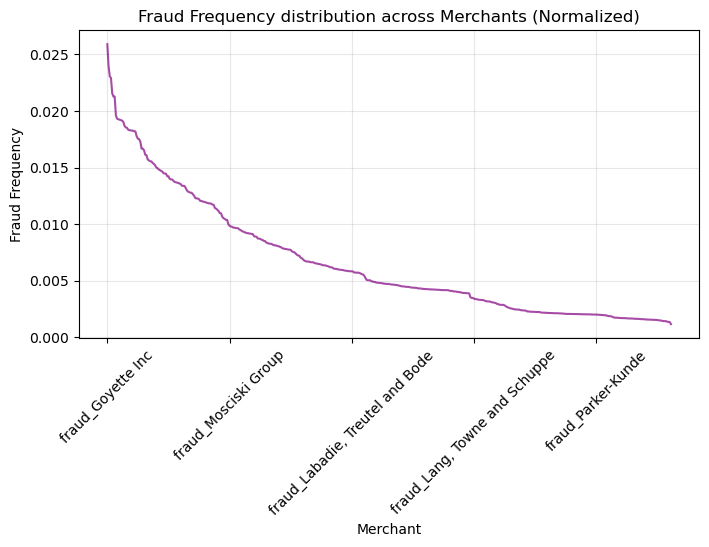

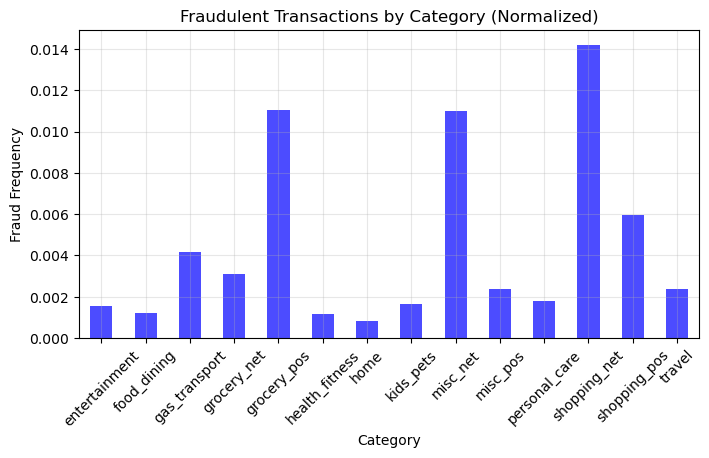

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame

# Fraud by Merchant - Normalized
merchant_fraud_frequency = (df[df['is_fraud'] == 1]['merchant'].value_counts() / df['merchant'].value_counts())
merchant_fraud_frequency_sorted = merchant_fraud_frequency.sort_values(ascending=False)



# Plot Fraud by Merchant Frequency
plt.figure(figsize=(8, 4))
merchant_fraud_frequency_sorted.plot(kind='line', color='purple', alpha=0.7)
plt.title("Fraud Frequency distribution across Merchants (Normalized)")
plt.xlabel("Merchant")
plt.ylabel("Fraud Frequency")
plt.grid(alpha=0.3)
plt.xticks(rotation=45)
plt.show()

# Fraud by Category - Normalized
category_fraud_frequency = (
    df[df['is_fraud'] == 1]['category'].value_counts() /
    df['category'].value_counts()
)

# Plot Fraud by Category Frequency
plt.figure(figsize=(8, 4))
category_fraud_frequency.plot(kind='bar', color='blue', alpha=0.7)
plt.title("Fraudulent Transactions by Category (Normalized)")
plt.xlabel("Category")
plt.ylabel("Fraud Frequency")
plt.grid(alpha=0.3)
plt.xticks(rotation=45)
plt.show()


## CC_NUM Fraud Pattern Analysis

In [25]:
## Step 1: Filter rows with is_fraud = 1
fraud_data = df[df['is_fraud'] == 1]

fraud_data.groupby('cc_num').apply(lambda x: x.sort_values("trans_date_trans_time")['trans_date_trans_time'].values[1])




# Step 1: Filter rows with is_fraud = 1
fraud_data = df[df['is_fraud'] == 1]

# Step 2: Group by cc_num and check for future frauds
def has_future_fraud(group):
    group = group.sort_values("trans_date_trans_time")
    times = group['trans_date_trans_time'].values
    
    # 60422928733           2019-04-17 00:08:16
    # 60422928733           2019-04-17 01:59:00
    ## This became a list 60422928733 -> [2019-04-17 00:08:16, 2019-04-17 01:59:00, ...]
    
    return any(t2 > t1 for t1, t2 in zip(times, times[1:]))

# Group by cc_num and apply the future fraud check
fraud_by_cc = fraud_data.groupby('cc_num').apply(has_future_fraud)

# Step 3: Compute the probability
num_frauds_with_future = fraud_by_cc.sum()
total_frauds = len(fraud_by_cc)

probability = num_frauds_with_future / total_frauds if total_frauds > 0 else 0

print(f"Probability of future fraud: {probability:.2f}")

Probability of future fraud: 1.00


C:\Users\s.crispino\AppData\Local\Temp\ipykernel_8564\2000963987.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fraudulent_data['cc_num_index'] = fraudulent_data['cc_num'].map(cc_num_mapping)


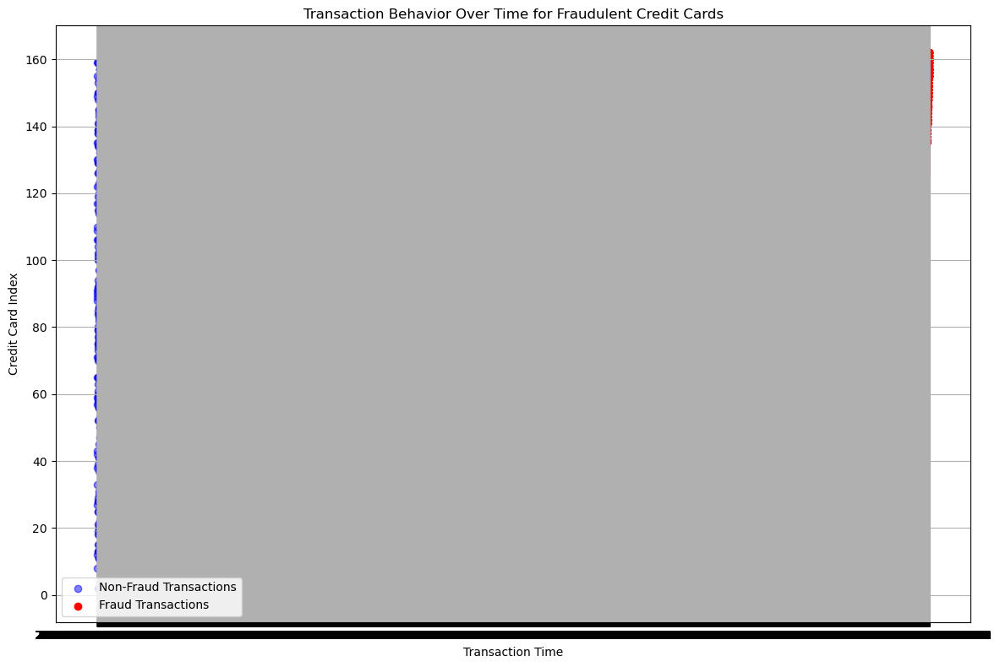

163


In [26]:
# Step 1: Filter cc_num with at least one fraud
fraudulent_cc_nums = data[data['is_fraud'] == 1]['cc_num'].unique()

# Step 2: Filter all transactions for those cc_num
fraudulent_data = data[data['cc_num'].isin(fraudulent_cc_nums)]

# Step 3: Assign an index for each cc_num for plotting
cc_num_mapping = {cc: idx for idx, cc in enumerate(fraudulent_cc_nums)}
fraudulent_data['cc_num_index'] = fraudulent_data['cc_num'].map(cc_num_mapping)

# Step 4: Plot the transactions
plt.figure(figsize=(12, 8))

# Non-fraud transactions
non_fraud = fraudulent_data[fraudulent_data['is_fraud'] == 0]
plt.scatter(non_fraud['trans_date_trans_time'], 
            non_fraud['cc_num_index'], 
            color='blue', alpha=0.5, label='Non-Fraud Transactions')

# Fraud transactions
fraud = fraudulent_data[fraudulent_data['is_fraud'] == 1]
plt.scatter(fraud['trans_date_trans_time'], 
            fraud['cc_num_index'], 
            color='red', label='Fraud Transactions')

# Add labels and legend
plt.xlabel("Transaction Time")
plt.ylabel("Credit Card Index")
plt.title("Transaction Behavior Over Time for Fraudulent Credit Cards")
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

print(len(fraudulent_cc_nums))


## Merchant - Fraud Analysis

C:\Users\s.crispino\AppData\Local\Temp\ipykernel_8564\21849153.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fraudulent_data['merchant_index'] = fraudulent_data['merchant'].map(merchant_mapping)
C:\Users\s.crispino\AppData\Local\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


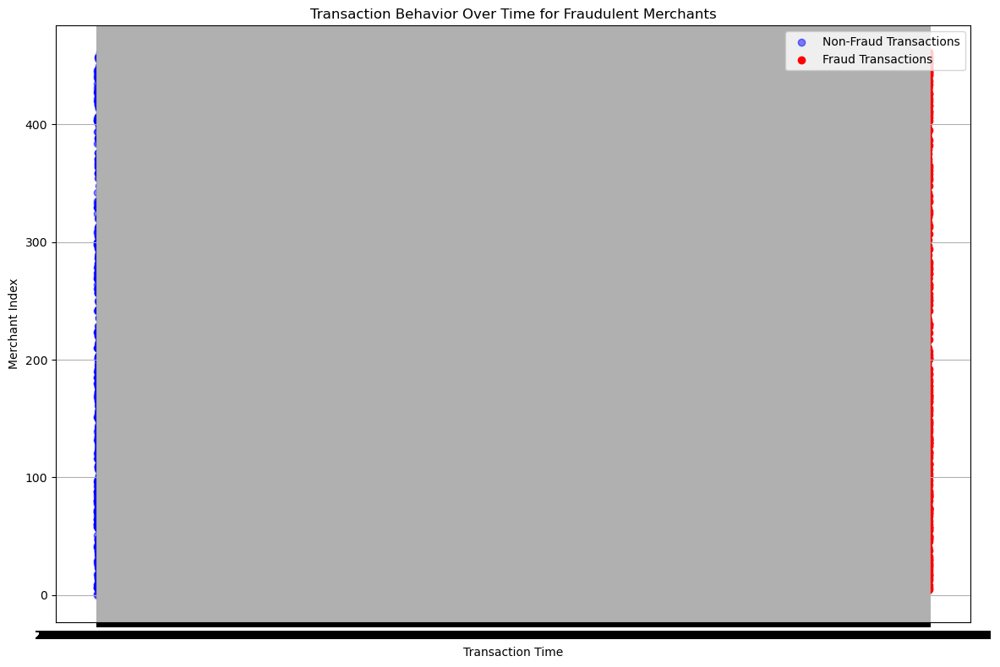

In [27]:
import pandas as pd
import matplotlib.pyplot as plt


# Step 1: Filter merchants with at least one fraud
fraudulent_merchants = data[data['is_fraud'] == 1]['merchant'].unique()

# Step 2: Filter all transactions for those merchants
fraudulent_data = data[data['merchant'].isin(fraudulent_merchants)]

# Step 3: Assign an index for each merchant for plotting
merchant_mapping = {merchant: idx for idx, merchant in enumerate(fraudulent_merchants)}
fraudulent_data['merchant_index'] = fraudulent_data['merchant'].map(merchant_mapping)

# Step 4: Plot the transactions
plt.figure(figsize=(12, 8))

# Non-fraud transactions
non_fraud = fraudulent_data[fraudulent_data['is_fraud'] == 0]
plt.scatter(non_fraud['trans_date_trans_time'], 
            non_fraud['merchant_index'], 
            color='blue', alpha=0.5, label='Non-Fraud Transactions')

# Fraud transactions
fraud = fraudulent_data[fraudulent_data['is_fraud'] == 1]
plt.scatter(fraud['trans_date_trans_time'], 
            fraud['merchant_index'], 
            color='red', label='Fraud Transactions')

# Add labels and legend
plt.xlabel("Transaction Time")
plt.ylabel("Merchant Index")
plt.title("Transaction Behavior Over Time for Fraudulent Merchants")
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()



## Category - Fraud Analysis

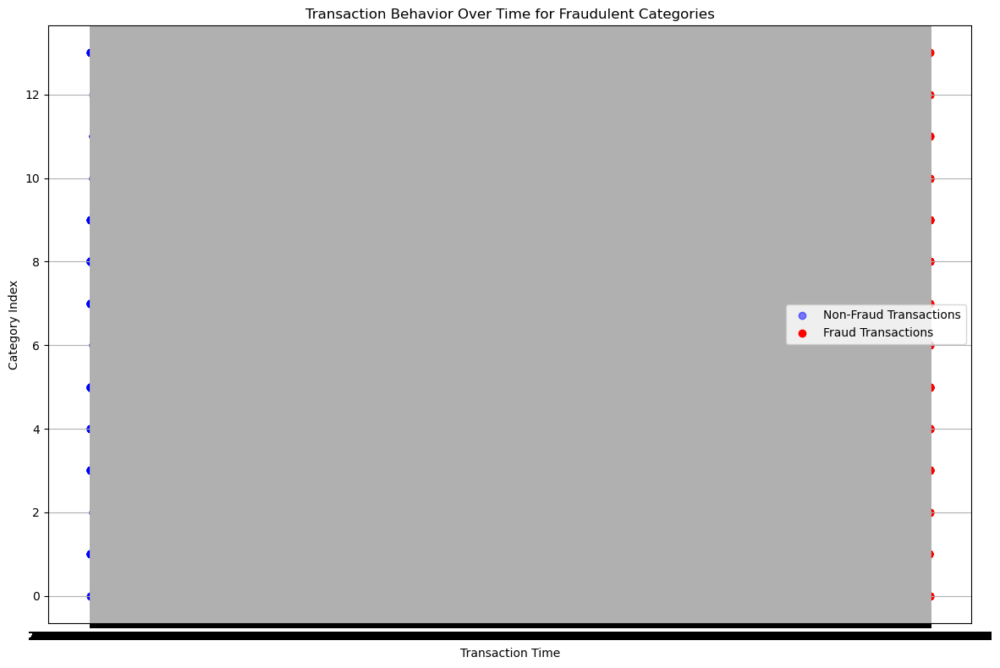

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Filter categories with at least one fraud
fraudulent_categories = data[data['is_fraud'] == 1]['category'].unique()

# Step 2: Filter all transactions for those categories
fraudulent_data = data[data['category'].isin(fraudulent_categories)]

# Step 3: Assign an index for each category for plotting
category_mapping = {category: idx for idx, category in enumerate(fraudulent_categories)}
fraudulent_data['category_index'] = fraudulent_data['category'].map(category_mapping)

# Step 4: Plot the transactions
plt.figure(figsize=(12, 8))

# Non-fraud transactions
non_fraud = fraudulent_data[fraudulent_data['is_fraud'] == 0]
plt.scatter(non_fraud['trans_date_trans_time'], 
            non_fraud['category_index'], 
            color='blue', alpha=0.5, label='Non-Fraud Transactions')

# Fraud transactions
fraud = fraudulent_data[fraudulent_data['is_fraud'] == 1]
plt.scatter(fraud['trans_date_trans_time'], 
            fraud['category_index'], 
            color='red', label='Fraud Transactions')

# Add labels and legend
plt.xlabel("Transaction Time")
plt.ylabel("Category Index")
plt.title("Transaction Behavior Over Time for Fraudulent Categories")
plt.legend()
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


## merchant_fraud_probability Time-Dependent

In [29]:

def create_merchant_fraud_probability(data):

    # Step 1: Ensure the data is sorted by time
    # data['trans_date_trans_time'] = pd.to_datetime(data['trans_date_trans_time']) --> already done my dear, already done
    data = data.sort_values(by=['merchant', 'trans_date_trans_time'])

    # Step 2: Initialize cumulative fraud statistics
    data['merchant_fraud_probability'] = 0.0

    # Step 3: Calculate cumulative stats for each merchant
    merchant_groups = data.groupby('merchant')

    ## Iterates through each merchant group
    for merchant, group in tqdm(merchant_groups, desc="Processing merchants", total=len(merchant_groups)):
        # Initialize cumulative counts
        total_count = 0
        fraud_count = 0

        ## Iteartes through each transaction of a specific mechant group
        for idx, row in group.iterrows():
            # Assign cumulative probability for the current transaction
            if total_count > 0:
                data.at[idx, 'merchant_fraud_probability'] = fraud_count / total_count
            else:
                # Default to global fraud rate for the first transaction
                ## global fraud rate provides a reasonable prior estimate for the likelihood of fraud 
                ### based on the overall (training) dataset
                ### This can make the feature more consistent across merchants, 
                ### especially for new merchants with very few transactions.
                ### INSTEAD:
                ### If you set the first fraud probability to 0, 
                ### you’re essentially assuming that there’s no chance of fraud for the first transaction, 
                ### which could bias the model.
                data.at[idx, 'merchant_fraud_probability'] = data['is_fraud'].mean()

            # Update cumulative counts
            total_count += 1
            fraud_count += row['is_fraud']

    # The feature 'merchant_fraud_probability' is now time-dependent and ready to use
    return data


## category_fraud_probability Time-Dependent

In [30]:
def create_category_fraud_probability(data):

    # Step 1: Ensure the data is sorted by time
    # Assuming the data['trans_date_trans_time'] is already a datetime column
    data = data.sort_values(by=['category', 'trans_date_trans_time'])

    data['category_fraud_probability'] = 0.0

    # Step 3: Calculate cumulative stats for each category
    category_groups = data.groupby('category')

    # Iterate through each category group
    for category, group in tqdm(category_groups, desc="Processing categories", total=len(category_groups)):
        # Initialize cumulative counts
        total_count = 0
        fraud_count = 0

        # Iterate through each transaction in the specific category group
        for idx, row in group.iterrows():
            # Assign cumulative probability for the current transaction
            if total_count > 0:
                data.at[idx, 'category_fraud_probability'] = fraud_count / total_count
            else:
                # Default to global fraud rate for the first transaction in the category
                data.at[idx, 'category_fraud_probability'] = data['is_fraud'].mean()

            # Update cumulative counts
            total_count += 1
            fraud_count += row['is_fraud']

    # The feature 'category_fraud_probability' is now time-dependent and ready to use
    return data


## Amount Analysis


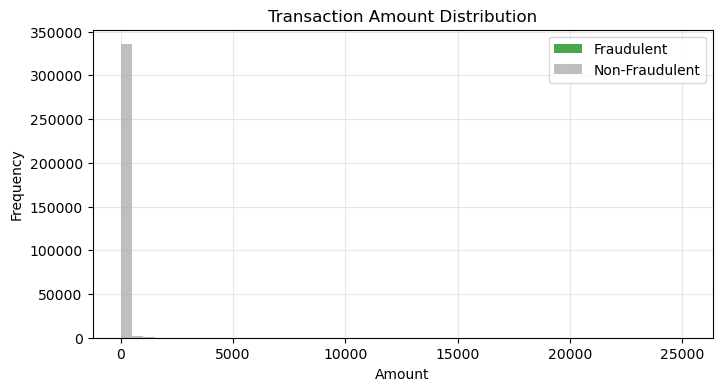

In [31]:
# Transaction Amount Distribution
plt.figure(figsize=(8, 4))
df[df['is_fraud'] == 1]['amt'].plot(kind='hist', bins=50, color='green', alpha=0.7, label='Fraudulent')
df[df['is_fraud'] == 0]['amt'].plot(kind='hist', bins=50, color='gray', alpha=0.5, label='Non-Fraudulent')
plt.title("Transaction Amount Distribution")
plt.xlabel("Amount")
plt.ylabel("Frequency")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


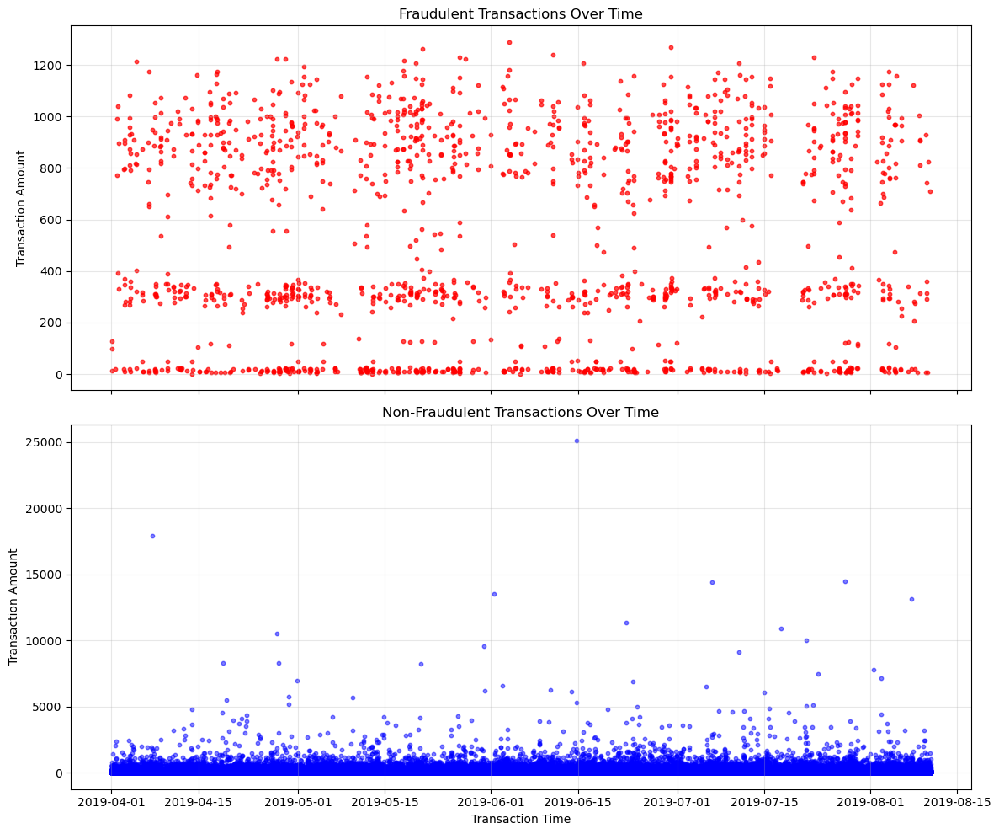

In [32]:
import matplotlib.pyplot as plt

# Ensure the data is sorted by time
df = df.sort_values(by='trans_date_trans_time')

# Separate fraudulent and non-fraudulent transactions
fraudulent = df[df['is_fraud'] == 1]
non_fraudulent = df[df['is_fraud'] == 0]

# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# Plot fraudulent transactions
axes[0].scatter(fraudulent['trans_date_trans_time'], fraudulent['amt'], color='red', alpha=0.7, s=10)
axes[0].set_title("Fraudulent Transactions Over Time")
axes[0].set_ylabel("Transaction Amount")
axes[0].grid(alpha=0.3)

# Plot non-fraudulent transactions
axes[1].scatter(non_fraudulent['trans_date_trans_time'], non_fraudulent['amt'], color='blue', alpha=0.5, s=10)
axes[1].set_title("Non-Fraudulent Transactions Over Time")
axes[1].set_xlabel("Transaction Time")
axes[1].set_ylabel("Transaction Amount")
axes[1].grid(alpha=0.3)

# Adjust layout and display
plt.tight_layout()
plt.show()


C:\Users\s.crispino\AppData\Local\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


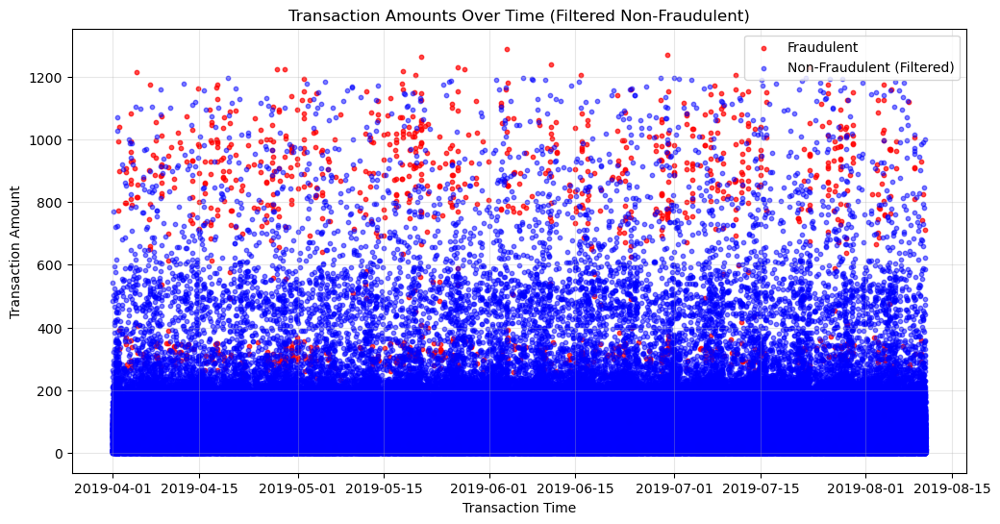

In [33]:
import matplotlib.pyplot as plt

# Ensure the data is sorted by time
df = df.sort_values(by='trans_date_trans_time')

# Separate fraudulent and filtered non-fraudulent transactions
fraudulent = df[df['is_fraud'] == 1]
non_fraudulent = df[(df['is_fraud'] == 0) & (df['amt'] <= 1200)]

# Plot the data
plt.figure(figsize=(12, 6))

# Plot fraudulent transactions
plt.scatter(fraudulent['trans_date_trans_time'], fraudulent['amt'], color='red', alpha=0.7, s=10, label='Fraudulent')

# Plot non-fraudulent transactions (filtered)
plt.scatter(non_fraudulent['trans_date_trans_time'], non_fraudulent['amt'], color='blue', alpha=0.5, s=10, label='Non-Fraudulent (Filtered)')

# Add titles and labels
plt.title("Transaction Amounts Over Time (Filtered Non-Fraudulent)")
plt.xlabel("Transaction Time")
plt.ylabel("Transaction Amount")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


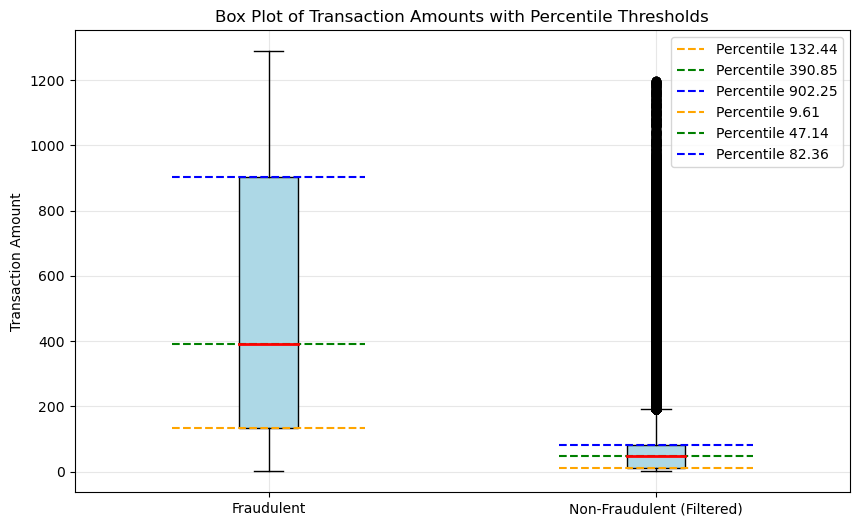

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Separate fraudulent and filtered non-fraudulent transactions
fraudulent = df[df['is_fraud'] == 1]
non_fraudulent = df[(df['is_fraud'] == 0) & (df['amt'] <= 1200)]

# Calculate percentiles for fraudulent and non-fraudulent
fraud_percentiles = np.percentile(fraudulent['amt'], [25, 50, 75])
non_fraud_percentiles = np.percentile(non_fraudulent['amt'], [25, 50, 75])

# Prepare data for the box plot
data_to_plot = [fraudulent['amt'], non_fraudulent['amt']]

# Create the box plot
plt.figure(figsize=(10, 6))
box = plt.boxplot(data_to_plot, vert=True, patch_artist=True, labels=['Fraudulent', 'Non-Fraudulent (Filtered)'],
                  boxprops=dict(facecolor='lightblue', color='black'),
                  whiskerprops=dict(color='black'),
                  capprops=dict(color='black'),
                  medianprops=dict(color='red', linewidth=2))

# Add percentile thresholds as horizontal lines
for i, percentiles in enumerate([fraud_percentiles, non_fraud_percentiles], start=1):
    for perc, color in zip(percentiles, ['orange', 'green', 'blue']):  # 25th, 50th (median), 75th
        plt.hlines(perc, i - 0.25, i + 0.25, colors=color, linestyles='dashed', label=f'Percentile {perc:.2f}')

# Remove duplicate legends
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper right')

# Add titles and labels
plt.title("Box Plot of Transaction Amounts with Percentile Thresholds")
plt.ylabel("Transaction Amount")
plt.grid(alpha=0.3)

# Show the plot
plt.show()


In [35]:
# Define the amount ranges
range1_min, range1_max = 132.44, 902.25
range2_min, range2_max = 390.85, 902.25
range3_min, range3_max = 9.61, 82.36
range4_min, range4_max =900, 1000

# Filter the data for each range
range1_data = df[(df['amt'] >= range1_min) & (df['amt'] <= range1_max)]
range2_data = df[(df['amt'] >= range2_min) & (df['amt'] <= range2_max)]
range3_data = df[(df['amt'] >= range3_min) & (df['amt'] <= range3_max)]
range4_data = df[(df['amt'] >= range4_min) & (df['amt'] <= range4_max)]

# Calculate fraud probabilities for each range
fraud_prob_range1 = range1_data['is_fraud'].mean()  # Proportion of frauds in range 1
fraud_prob_range2 = range2_data['is_fraud'].mean()  # Proportion of frauds in range 2
fraud_prob_range3 = range3_data['is_fraud'].mean()  # Proportion of frauds in range 2
fraud_prob_range4 = range4_data['is_fraud'].mean()  # Proportion of frauds in range 2

# Print the results
print(f"Fraud probability for amount range {range1_min} to {range1_max}: {fraud_prob_range1:.4f}")
print(f"Fraud probability for amount range {range2_min} to {range2_max}: {fraud_prob_range2:.4f}")
print(f"Fraud probability for amount range {range3_min} to {range3_max}: {fraud_prob_range3:.4f}")
print(f"Fraud probability for amount range {range4_min} to {range4_max}: {fraud_prob_range4:.4f}")


Fraud probability for amount range 132.44 to 902.25: 0.0224
Fraud probability for amount range 390.85 to 902.25: 0.0890
Fraud probability for amount range 9.61 to 82.36: 0.0016
Fraud probability for amount range 900 to 1000: 0.5501


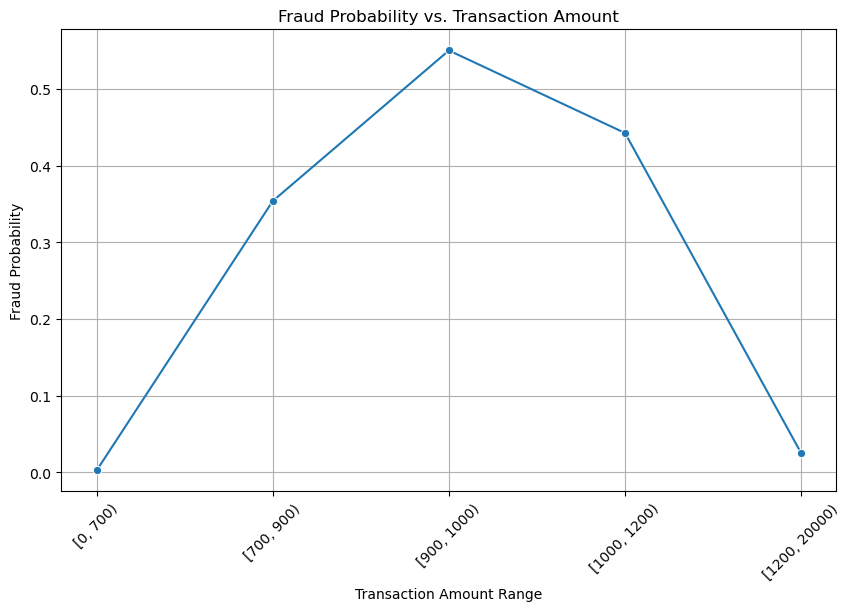

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Define the bins for the 'amt' range (You can adjust the number of bins as needed)
bin_edges = [0, 700, 900, 1000, 1200, 20000]  # Adjust the ranges as needed
df['amt_binned'] = pd.cut(df['amt'], bins=bin_edges, right=False)

# Step 2: Calculate the fraud probability for each bin
fraud_prob_by_amt = df.groupby('amt_binned')['is_fraud'].mean()

# Step 3: Plotting the fraud probability against the amt range bins
plt.figure(figsize=(10, 6))
sns.lineplot(x=fraud_prob_by_amt.index.astype(str), y=fraud_prob_by_amt.values, marker='o')
plt.title("Fraud Probability vs. Transaction Amount")
plt.xlabel("Transaction Amount Range")
plt.ylabel("Fraud Probability")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


In [37]:
from tqdm import tqdm

def create_fraud_prob_by_amt(df):

    # Step 1: Define the custom bins for the 'amt' column, with dynamic upper bound
    max_amt = df['amt'].max()  # Get the maximum amount available in the 'amt' column
    bin_edges = [0, 700, 900, 1000, 1200, max_amt]  # Use max_amt as the upper bound for the last bin
    bin_labels = ['0-700', '700-900', '900-1000', '1000-1200', f'1200-{max_amt}']

    # Step 2: Create a new feature 'amt_range' that assigns each 'amt' to the defined bins
    df['amt_range'] = pd.cut(df['amt'], bins=bin_edges, labels=bin_labels, right=False)

    # Step 3: Add 'NaN' as a valid category to the 'amt_range' column
    df['amt_range'] = df['amt_range'].cat.add_categories('NaN')

    # Handle NaN values in amt_range
    df['amt_range'] = df['amt_range'].fillna('NaN')  # Assign 'NaN' to missing values

    # Step 3: Sort data by 'trans_date_trans_time' to ensure the time order
    df = df.sort_values(by=['trans_date_trans_time'])

    # Step 4: Initialize cumulative fraud statistics for each amt_range
    df['fraud_prob_by_amt'] = 0.0  # Initialize fraud probability

    # Step 5: Calculate time-dependent fraud probability for each transaction based on amt_range
    cumulative_fraud = {label: 0 for label in bin_labels}  # Store cumulative fraud count for each amt_range
    cumulative_total = {label: 0 for label in bin_labels}  # Store cumulative total count for each amt_range

    # Use tqdm to add a progress bar
    for idx, row in tqdm(df.iterrows(), total=len(df), desc="Calculating fraud probabilities", unit="row"):
        # Get the amt_range for the current transaction
        amt_range = row['amt_range']

        # If amt_range is 'NaN', you can choose to handle it differently (e.g., assign a default probability)
        if amt_range == 'NaN':
            df.at[idx, 'fraud_prob_by_amt'] = df['is_fraud'].mean()  # or set a custom value
        else:
            # Calculate the cumulative fraud probability for the current amt_range
            if cumulative_total[amt_range] > 0:
                df.at[idx, 'fraud_prob_by_amt'] = cumulative_fraud[amt_range] / cumulative_total[amt_range]
            else:
                # If no previous transactions in the range, use the global fraud rate
                df.at[idx, 'fraud_prob_by_amt'] = df['is_fraud'].mean()

            # Update cumulative counts for amt_range
            cumulative_total[amt_range] += 1
            cumulative_fraud[amt_range] += row['is_fraud']

    # Step 6: Drop the support column 'amt_range' after the 'fraud_prob_by_amt' feature has been created
    df.drop(columns=['amt_range'], inplace=True)
    
    # Now, df contains the 'fraud_prob_by_amt' feature, which is time-dependent
    return df


## Customer Demographics

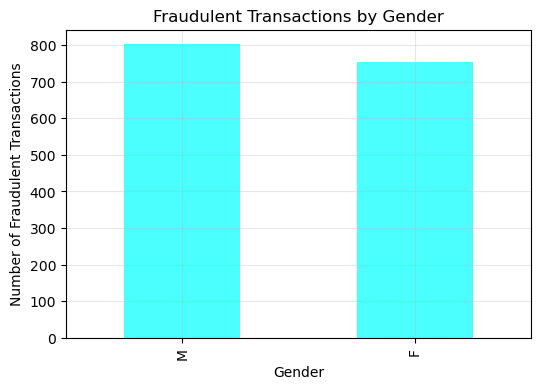

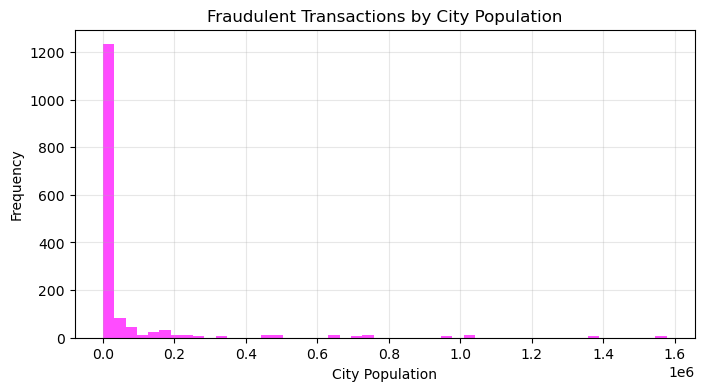

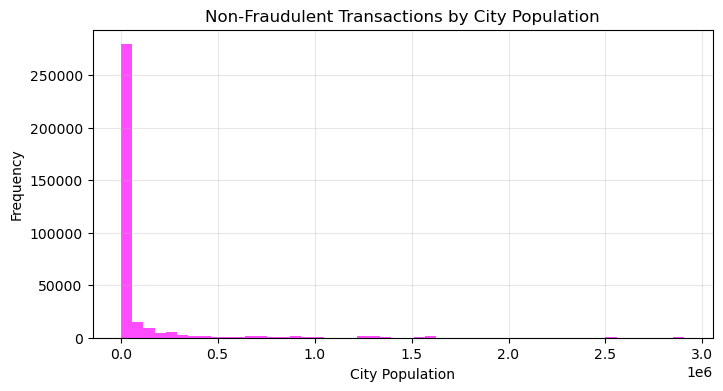

In [38]:
# Fraud by Gender
plt.figure(figsize=(6, 4))
df[df['is_fraud'] == 1]['gender'].value_counts().plot(kind='bar', color='cyan', alpha=0.7)
plt.title("Fraudulent Transactions by Gender")
plt.xlabel("Gender")
plt.ylabel("Number of Fraudulent Transactions")
plt.grid(alpha=0.3)
plt.show()

# Fraud by City Population
plt.figure(figsize=(8, 4))
df[df['is_fraud'] == 1]['city_pop'].plot(kind='hist', bins=50, color='magenta', alpha=0.7)
plt.title("Fraudulent Transactions by City Population")
plt.xlabel("City Population")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.show()


# Fraud by City Population
plt.figure(figsize=(8, 4))
df[df['is_fraud'] == 0]['city_pop'].plot(kind='hist', bins=50, color='magenta', alpha=0.7)
plt.title("Non-Fraudulent Transactions by City Population")
plt.xlabel("City Population")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.show()


## Geographic Insights

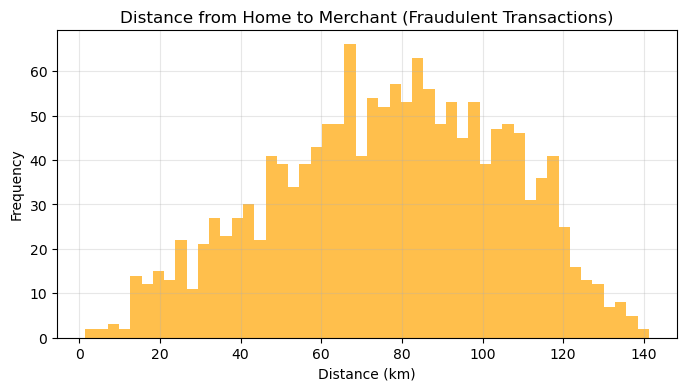

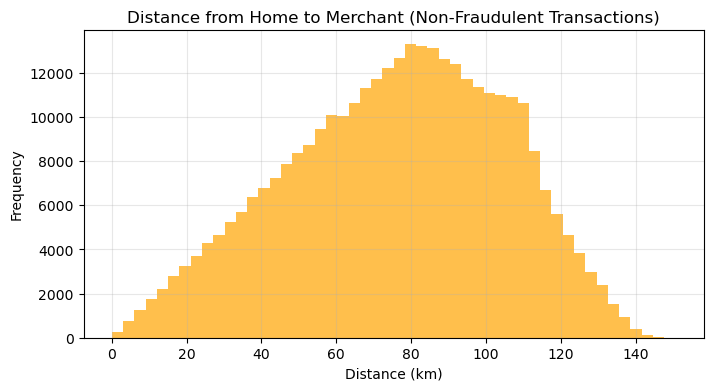

In [39]:
from geopy.distance import geodesic

# Calculate distance between customer and merchant
df['distance_home_merchant'] = df.apply(lambda row: geodesic((row['lat'], row['long']), (row['merch_lat'], row['merch_long'])).km, axis=1)

# Distance Distribution for Fraudulent Transactions
plt.figure(figsize=(8, 4))
df[df['is_fraud'] == 1]['distance_home_merchant'].plot(kind='hist', bins=50, color='orange', alpha=0.7)
plt.title("Distance from Home to Merchant (Fraudulent Transactions)")
plt.xlabel("Distance (km)")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.show()


# Distance Distribution for Fraudulent Transactions
plt.figure(figsize=(8, 4))
df[df['is_fraud'] == 0]['distance_home_merchant'].plot(kind='hist', bins=50, color='orange', alpha=0.7)
plt.title("Distance from Home to Merchant (Non-Fraudulent Transactions)")
plt.xlabel("Distance (km)")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.show()

## Card Usage Behavior

C:\Users\s.crispino\AppData\Local\Temp\ipykernel_8564\3442921803.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[df['is_fraud'] == 1][df['time_diff_last_tx']<= 100000]['time_diff_last_tx'].plot(kind='hist', bins=50, color='pink', alpha=0.7)


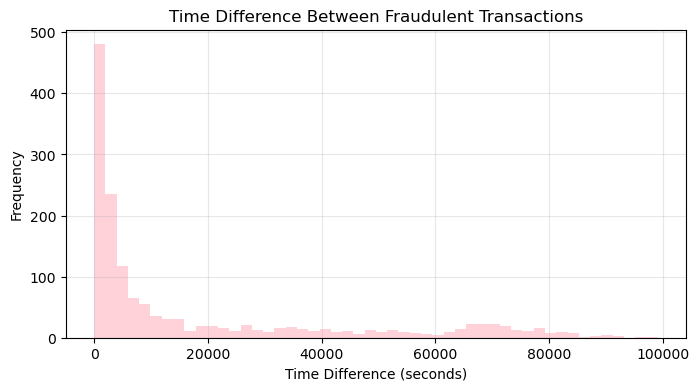

C:\Users\s.crispino\AppData\Local\Temp\ipykernel_8564\3442921803.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[df['is_fraud'] == 0][df['time_diff_last_tx']<= 100000]['time_diff_last_tx'].plot(kind='hist', bins=50, color='pink', alpha=0.7)


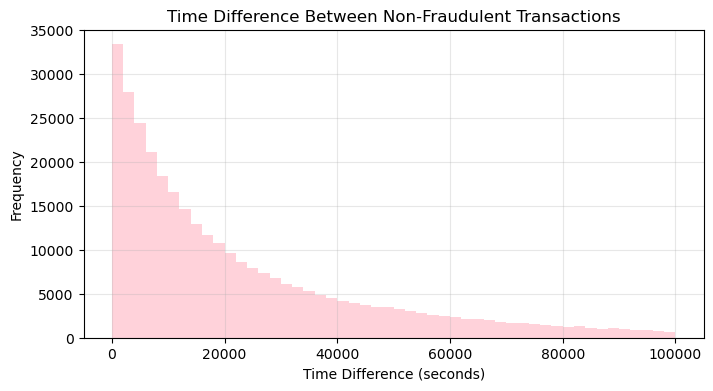

In [40]:


# Time Between Transactions
df['time_diff_last_tx'] = df.groupby('cc_num')['unix_time'].diff().fillna(0)

plt.figure(figsize=(8, 4))
df[df['is_fraud'] == 1][df['time_diff_last_tx']<= 100000]['time_diff_last_tx'].plot(kind='hist', bins=50, color='pink', alpha=0.7)
plt.title("Time Difference Between Fraudulent Transactions")
plt.xlabel("Time Difference (seconds)")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.show()

plt.figure(figsize=(8, 4))
df[df['is_fraud'] == 0][df['time_diff_last_tx']<= 100000]['time_diff_last_tx'].plot(kind='hist', bins=50, color='pink', alpha=0.7)
plt.title("Time Difference Between Non-Fraudulent Transactions")
plt.xlabel("Time Difference (seconds)")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.show()


## Temporal Behavior of Fraud

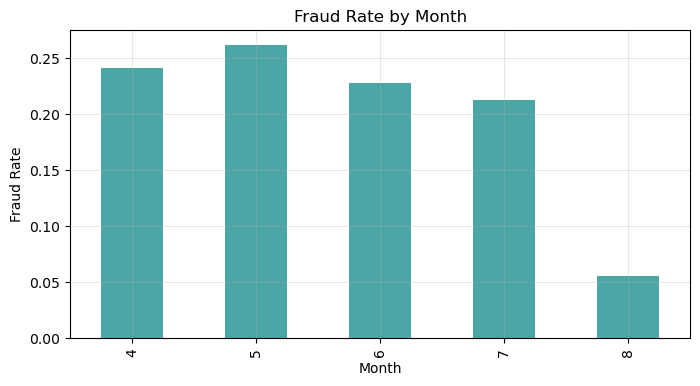

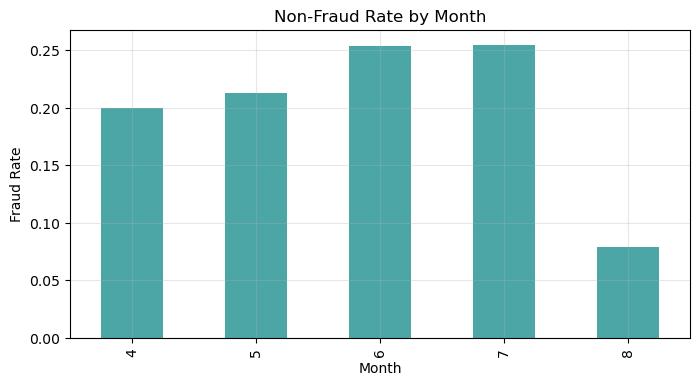

In [41]:
# Fraud Rate by Month
df['month'] = df['trans_date_trans_time'].dt.month
fraud_rate_by_month = df[df['is_fraud'] == 1]['month'].value_counts(normalize=True)

plt.figure(figsize=(8, 4))
fraud_rate_by_month.sort_index().plot(kind='bar', color='teal', alpha=0.7)
plt.title("Fraud Rate by Month")
plt.xlabel("Month")
plt.ylabel("Fraud Rate")
plt.grid(alpha=0.3)
plt.show()


fraud_rate_by_month = df[df['is_fraud'] == 0]['month'].value_counts(normalize=True)

plt.figure(figsize=(8, 4))
fraud_rate_by_month.sort_index().plot(kind='bar', color='teal', alpha=0.7)
plt.title("Non-Fraud Rate by Month")
plt.xlabel("Month")
plt.ylabel("Fraud Rate")
plt.grid(alpha=0.3)
plt.show()


## Combined Features Analysis

In [42]:
data, test = get_original_training_data(light=True)


print(data.shape)
print(test.shape)

df = data

train shape  (340000, 22)
test shape  (60000, 22)
(340000, 22)
(60000, 22)


In [43]:
data['trans_date_trans_time'] = pd.to_datetime(data['trans_date_trans_time'])

data = create_hourly_fraud_probability(data)
data = create_merchant_fraud_probability(data)
data = create_category_fraud_probability(data)
data = create_fraud_prob_by_amt(data)

Calculating fraud probabilities: 100%|█████████████████████████████████████| 340000/340000 [00:21<00:00, 16034.52row/s]


In [44]:
data['distance'] = haversine(data['lat'], data['long'], data['merch_lat'], data['merch_long'])

In [45]:
data.columns

Index(['trans_date_trans_time', 'cc_num', 'merchant', 'category', 'amt',
       'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'lat',
       'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time', 'merch_lat',
       'merch_long', 'is_fraud', 'hour', 'hourly_fraud_probability',
       'merchant_fraud_probability', 'category_fraud_probability',
       'fraud_prob_by_amt', 'distance'],
      dtype='object')

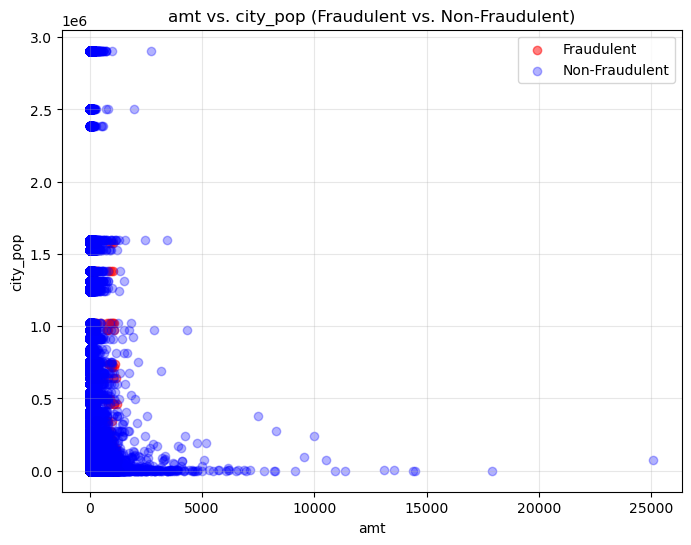

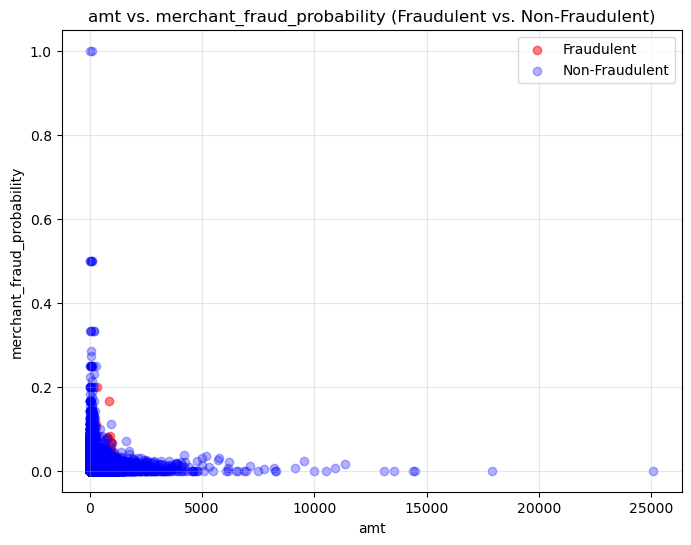

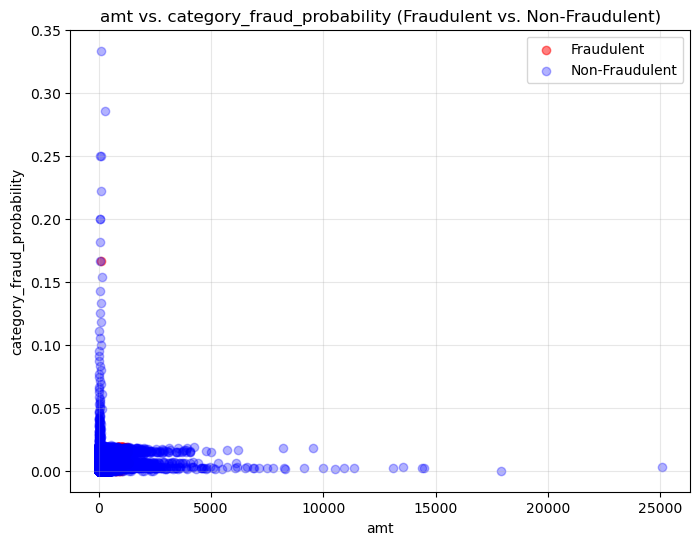

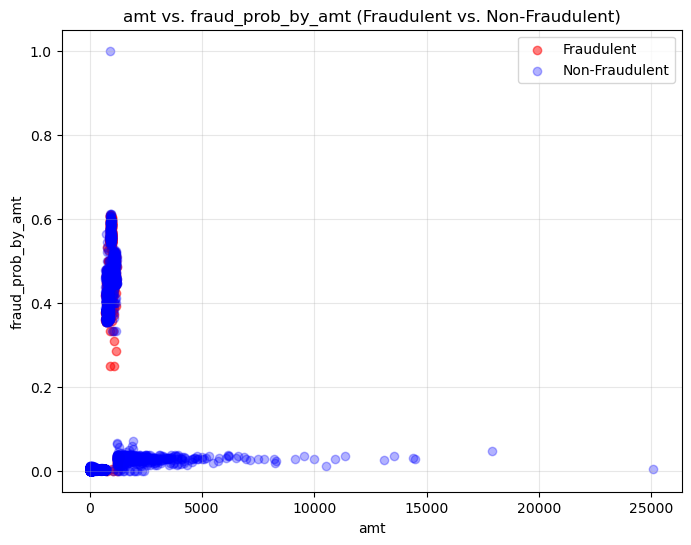

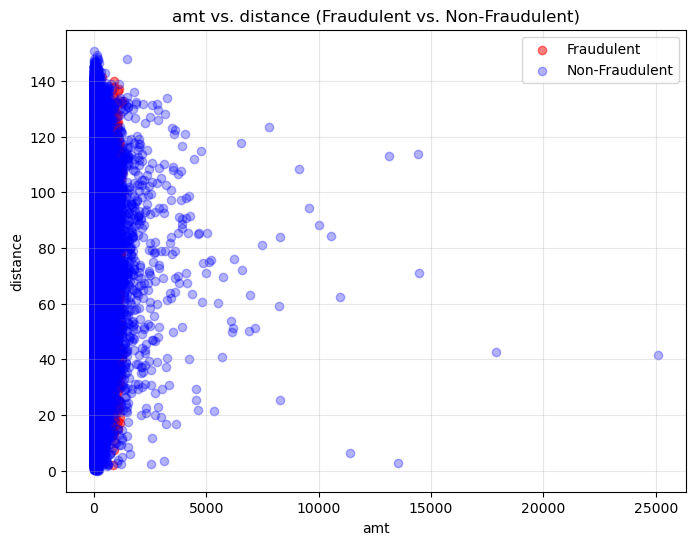

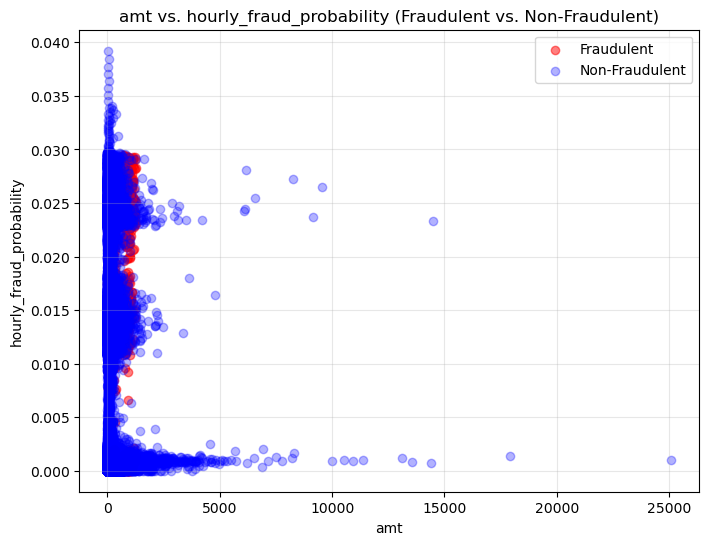

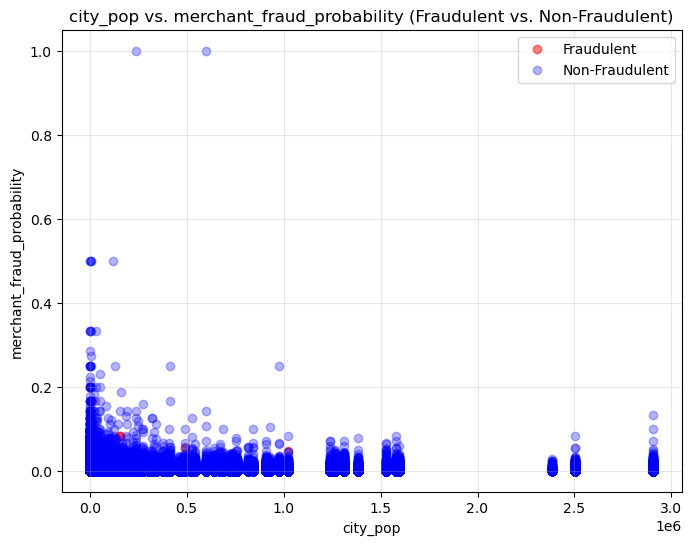

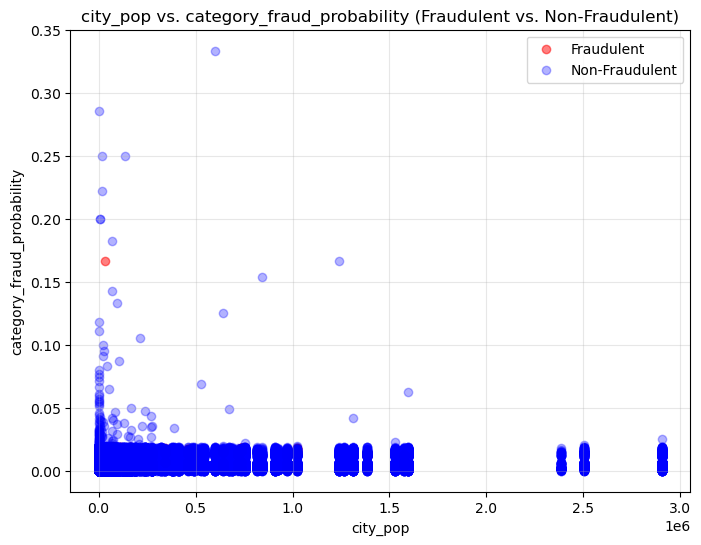

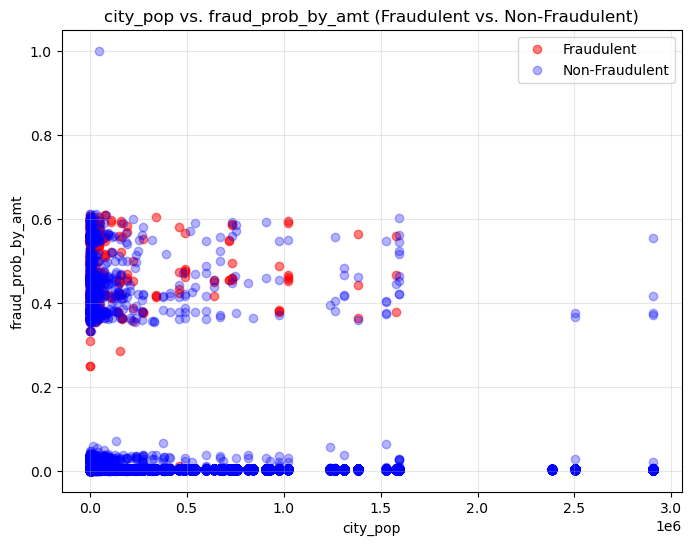

C:\Users\s.crispino\AppData\Local\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


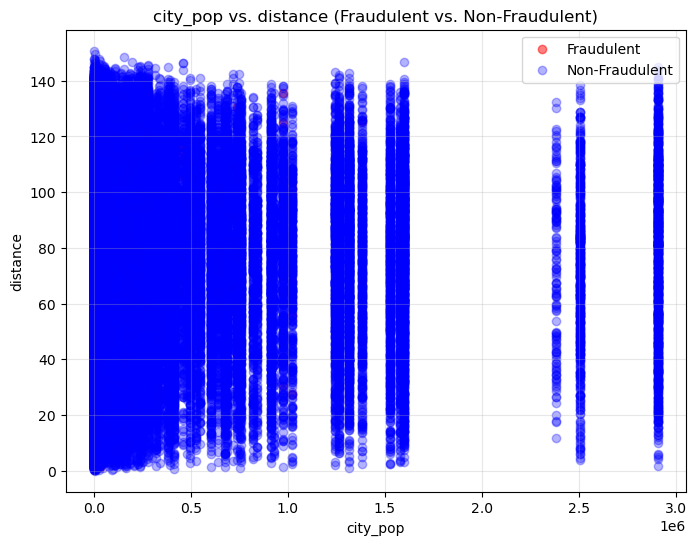

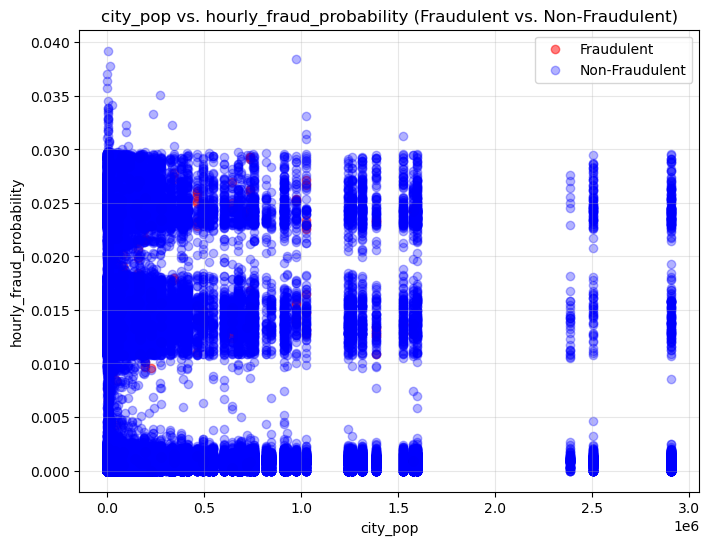

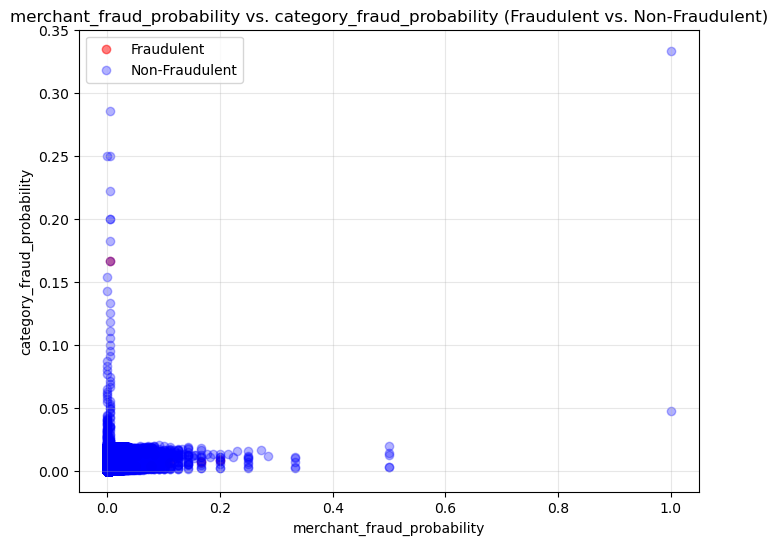

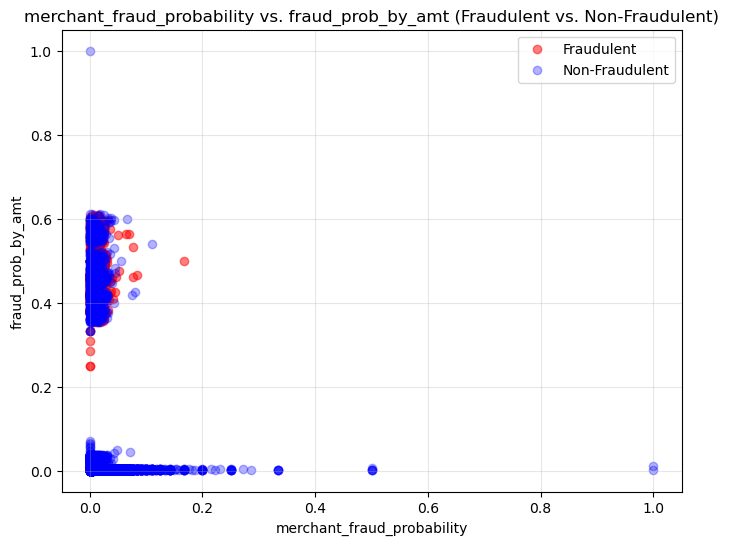

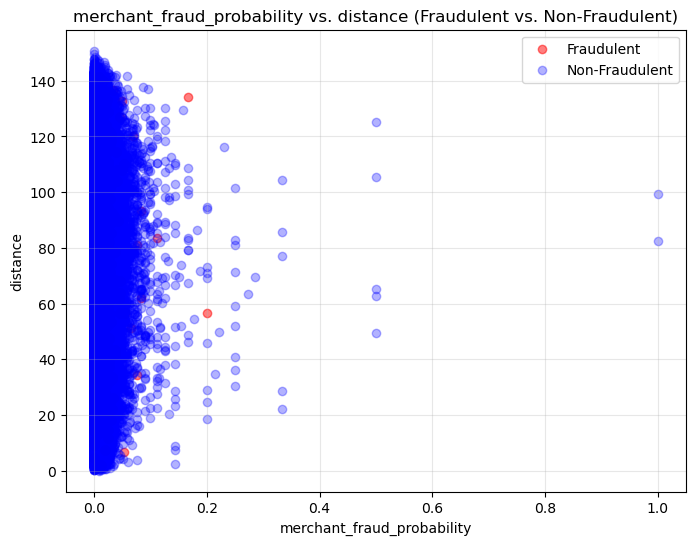

...

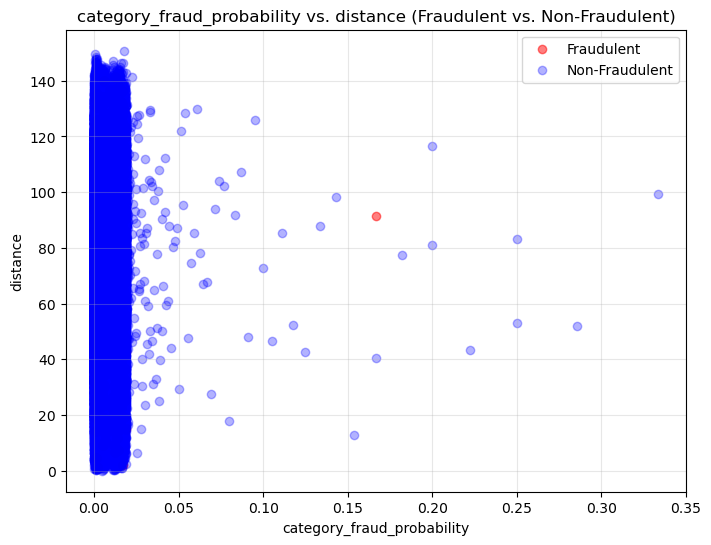

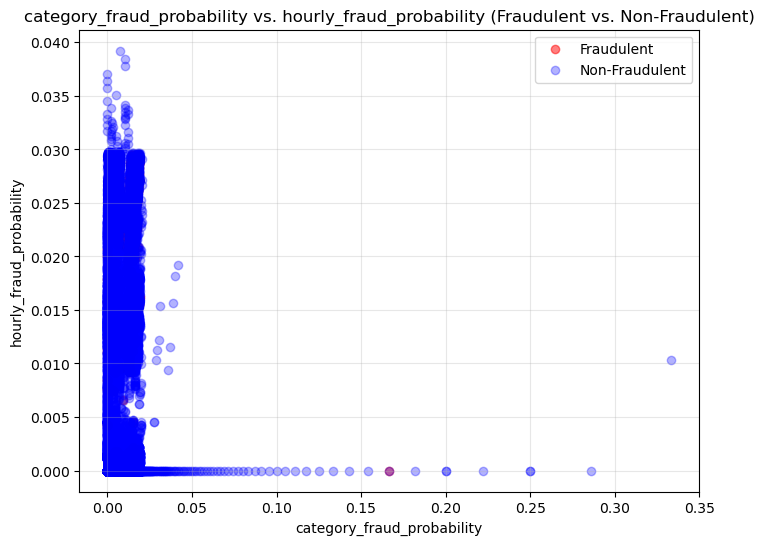

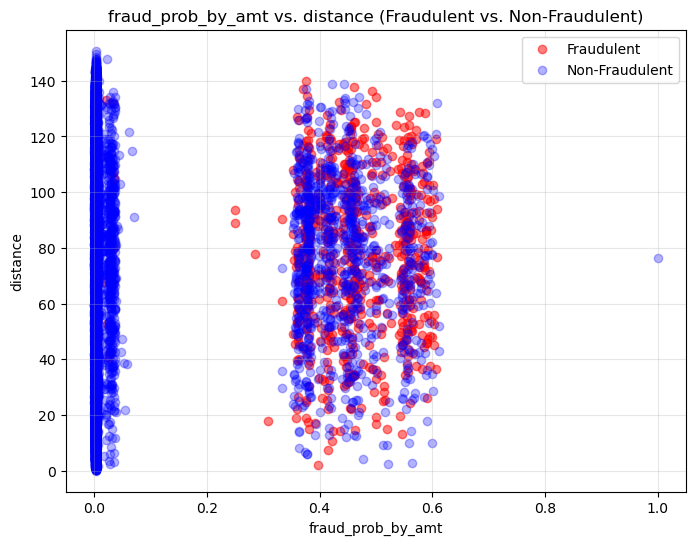

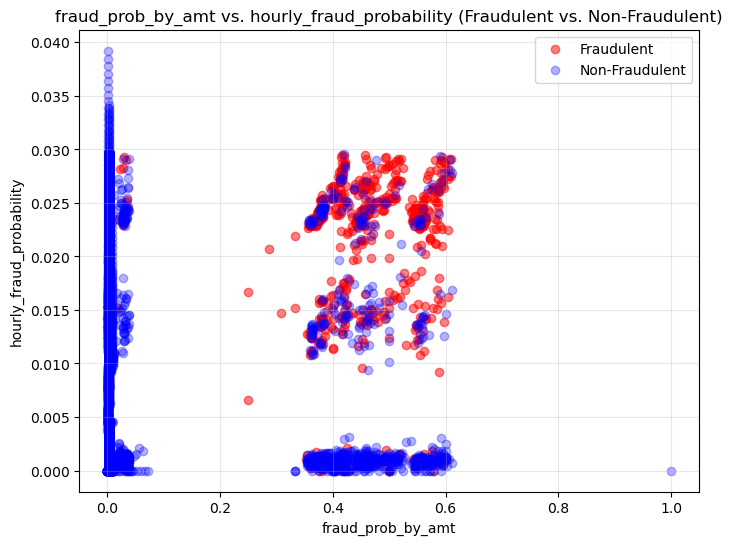

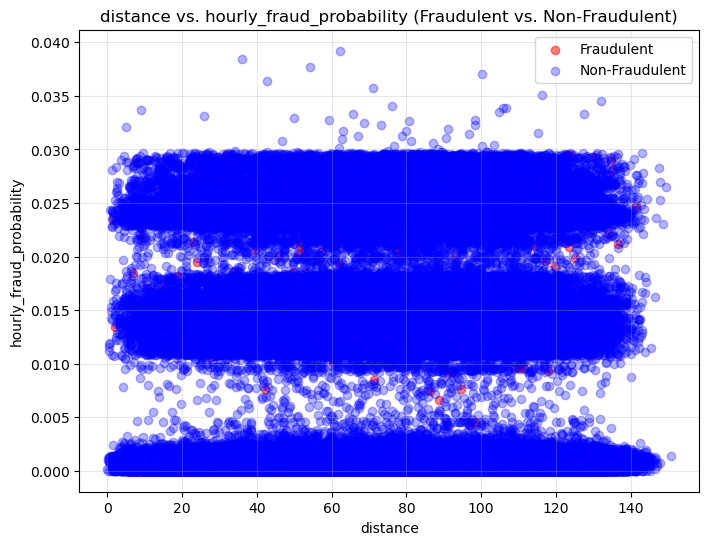

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

df = data

# List of features you want to plot
features = ['amt', 'city_pop', 'merchant_fraud_probability',
       'category_fraud_probability', 'fraud_prob_by_amt', 'distance', 'hourly_fraud_probability']

# Iterate through each combination of two features
for feature1, feature2 in combinations(features, 2):
    plt.figure(figsize=(8, 6))

    # Scatter plot for fraudulent transactions
    plt.scatter(df[df['is_fraud'] == 1][feature1], df[df['is_fraud'] == 1][feature2], 
                c='red', label='Fraudulent', alpha=0.5)

    # Scatter plot for non-fraudulent transactions
    plt.scatter(df[df['is_fraud'] == 0][feature1], df[df['is_fraud'] == 0][feature2], 
                c='blue', label='Non-Fraudulent', alpha=0.3)

    # Add plot title, labels, and legend
    plt.title(f"{feature1} vs. {feature2} (Fraudulent vs. Non-Fraudulent)")
    plt.xlabel(feature1)
    plt.ylabel(feature2)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()


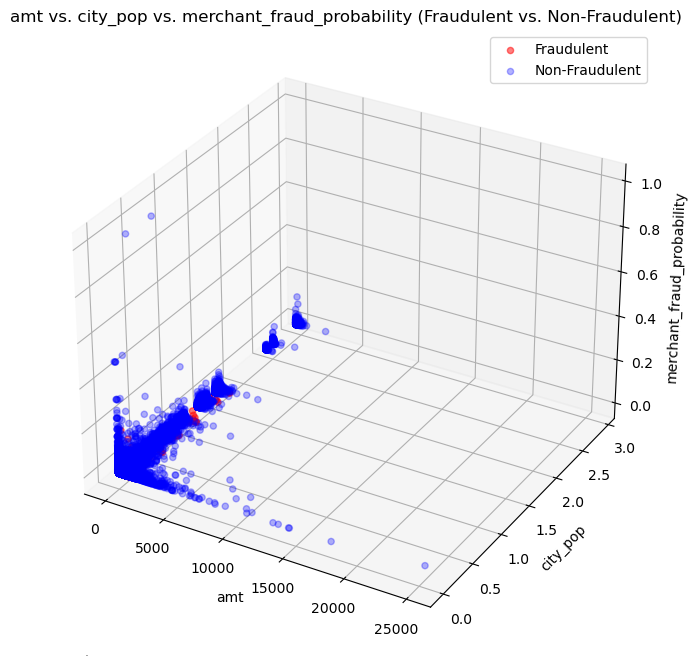

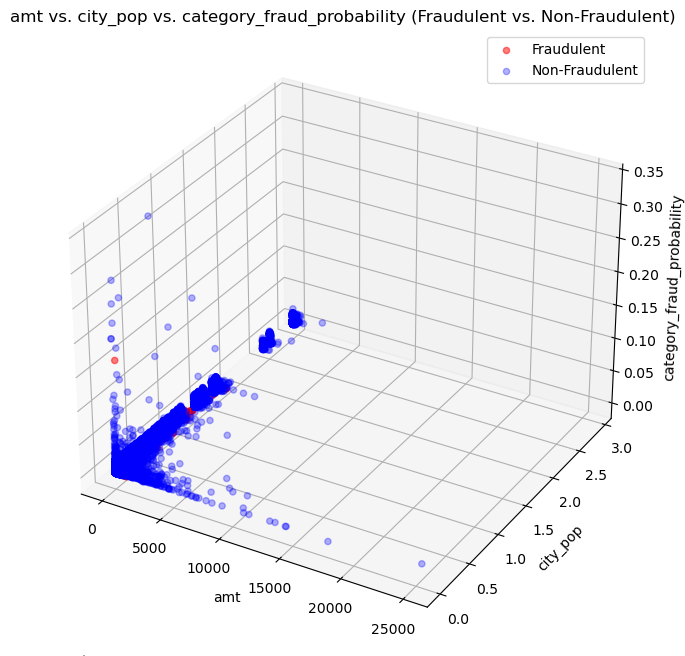

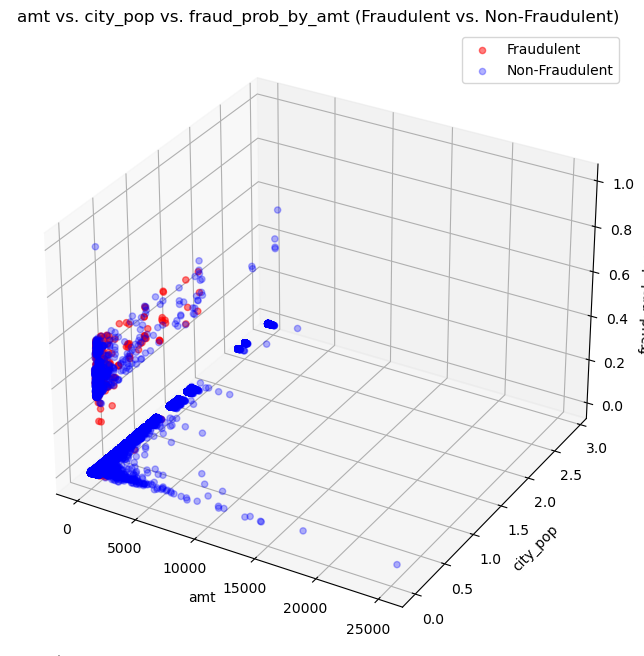

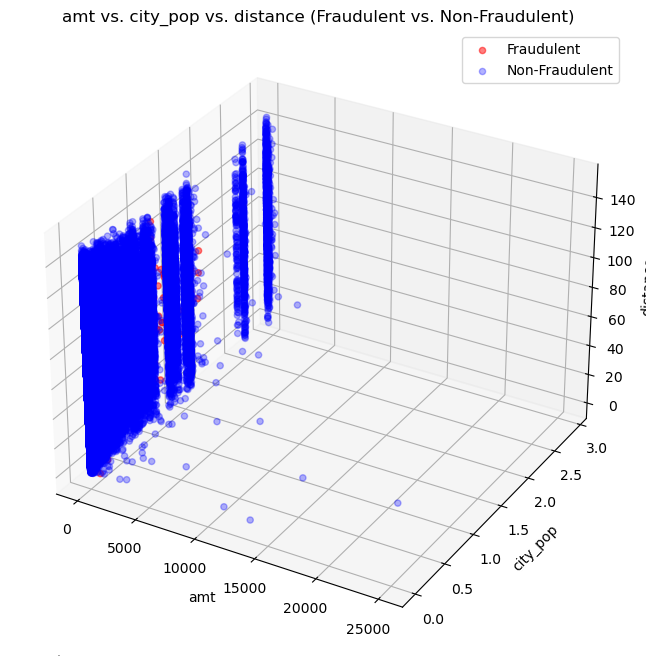

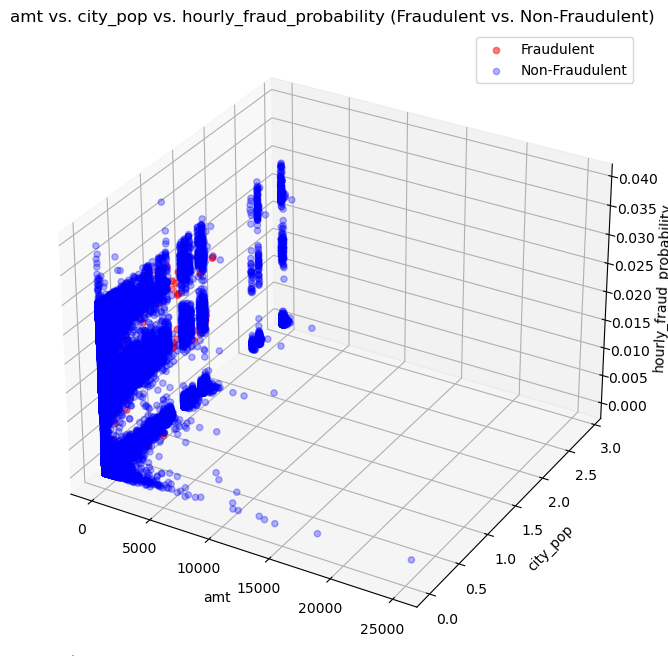

...

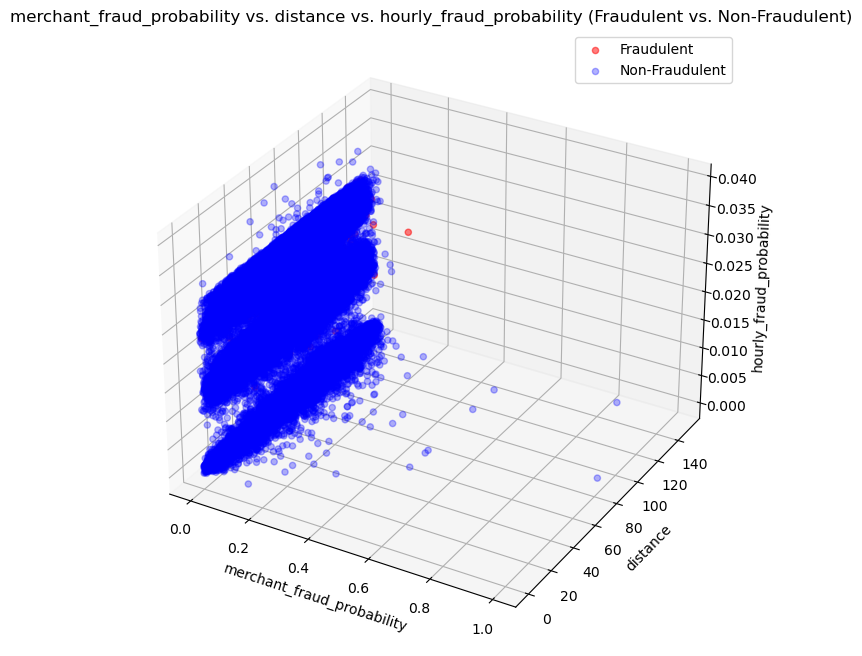

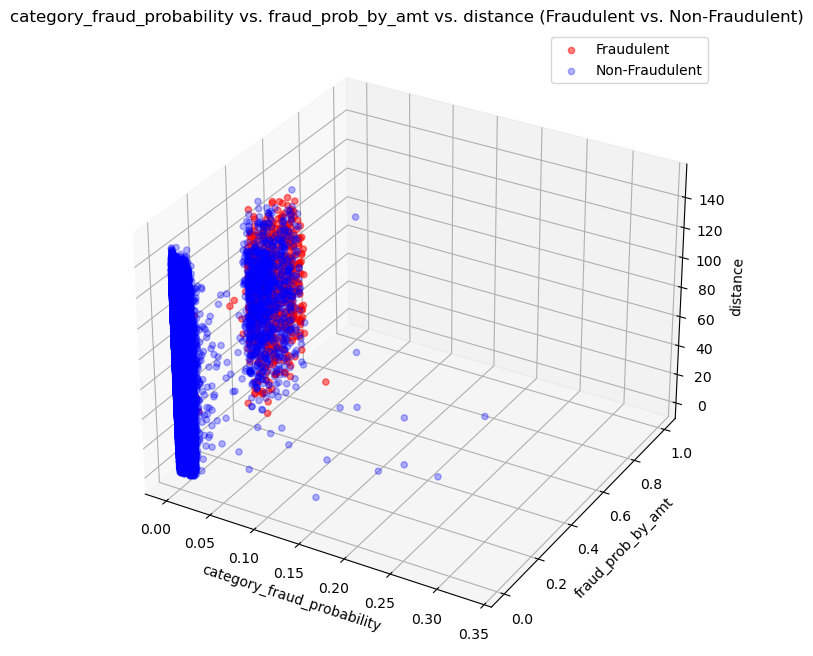

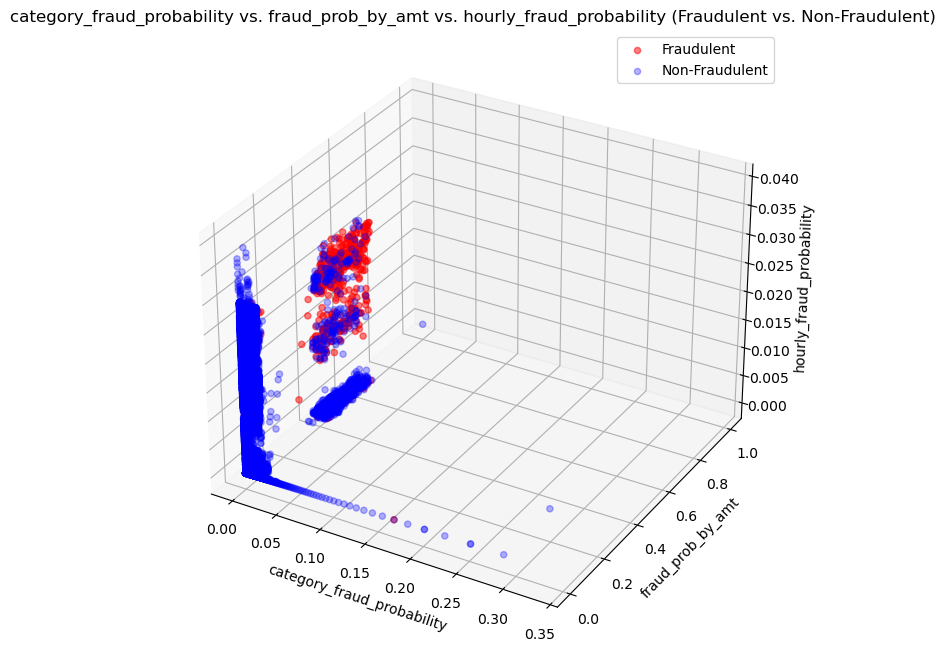

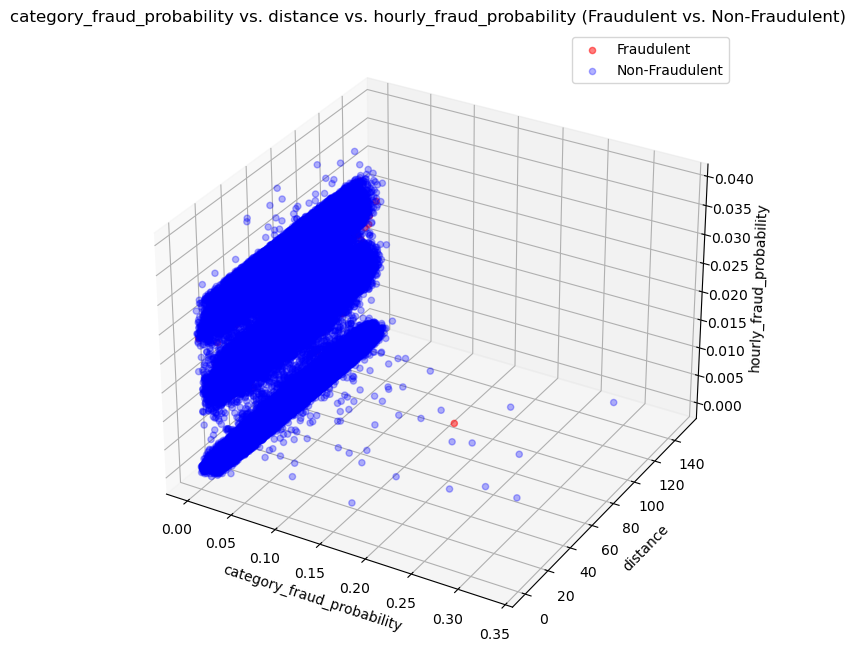

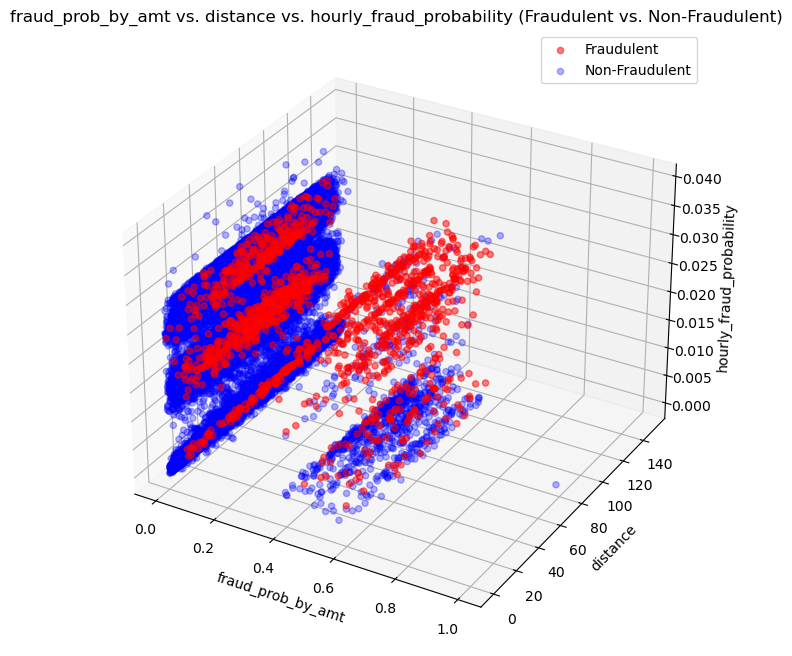

In [47]:
import matplotlib.pyplot as plt
from itertools import combinations
from mpl_toolkits.mplot3d import Axes3D

# List of features you want to plot
features = ['amt', 'city_pop', 'merchant_fraud_probability',
            'category_fraud_probability', 'fraud_prob_by_amt', 
            'distance', 'hourly_fraud_probability']

# Iterate through each combination of three features
for feature1, feature2, feature3 in combinations(features, 3):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # 3D scatter plot for fraudulent transactions
    ax.scatter(df[df['is_fraud'] == 1][feature1], 
               df[df['is_fraud'] == 1][feature2], 
               df[df['is_fraud'] == 1][feature3], 
               c='red', label='Fraudulent', alpha=0.5)
    
    # 3D scatter plot for non-fraudulent transactions
    ax.scatter(df[df['is_fraud'] == 0][feature1], 
               df[df['is_fraud'] == 0][feature2], 
               df[df['is_fraud'] == 0][feature3], 
               c='blue', label='Non-Fraudulent', alpha=0.3)
    
    # Add plot title, labels, and legend
    ax.set_title(f"{feature1} vs. {feature2} vs. {feature3} (Fraudulent vs. Non-Fraudulent)")
    ax.set_xlabel(feature1)
    ax.set_ylabel(feature2)
    ax.set_zlabel(feature3)
    ax.legend()
    plt.show()


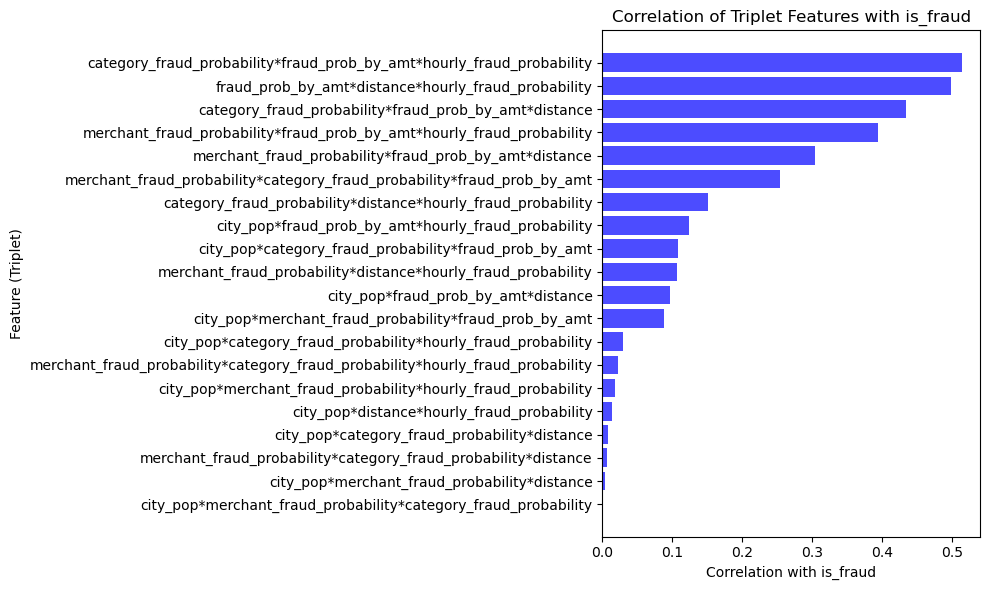

                                             Feature  Correlation
0  category_fraud_probability*fraud_prob_by_amt*h...     0.514044
1  fraud_prob_by_amt*distance*hourly_fraud_probab...     0.497877
2  category_fraud_probability*fraud_prob_by_amt*d...     0.434573
3  merchant_fraud_probability*fraud_prob_by_amt*h...     0.394210
4  merchant_fraud_probability*fraud_prob_by_amt*d...     0.303367
5  merchant_fraud_probability*category_fraud_prob...     0.253684
6  category_fraud_probability*distance*hourly_fra...     0.150985
7  city_pop*fraud_prob_by_amt*hourly_fraud_probab...     0.123698
8  city_pop*category_fraud_probability*fraud_prob...     0.108508
9  merchant_fraud_probability*distance*hourly_fra...     0.107131


In [48]:
import pandas as pd
import matplotlib.pyplot as plt
from itertools import combinations

# List of features to consider for triplets
features = ['city_pop', 'merchant_fraud_probability',
            'category_fraud_probability', 'fraud_prob_by_amt', 
            'distance', 'hourly_fraud_probability']

# Dictionary to store the correlations
correlations = {}

# Iterate through all combinations of triplets
for feature1, feature2, feature3 in combinations(features, 3):
    # Create a new feature by multiplying the three columns
    new_feature_name = f"{feature1}*{feature2}*{feature3}"
    df[new_feature_name] = df[feature1] * df[feature2] * df[feature3]
    
    # Compute the correlation with 'is_fraud'
    correlation = df[new_feature_name].corr(df['is_fraud'])
    
    # Store the result
    correlations[new_feature_name] = correlation

# Sort the correlations in descending order
sorted_correlations = {k: v for k, v in sorted(correlations.items(), key=lambda item: abs(item[1]), reverse=True)}

# Convert the sorted correlations to a DataFrame for visualization
correlation_df = pd.DataFrame(sorted_correlations.items(), columns=['Feature', 'Correlation'])

# Plot the correlations
plt.figure(figsize=(10, 6))
plt.barh(correlation_df['Feature'], correlation_df['Correlation'], color='blue', alpha=0.7)
plt.xlabel('Correlation with is_fraud')
plt.ylabel('Feature (Triplet)')
plt.title('Correlation of Triplet Features with is_fraud')
plt.gca().invert_yaxis()  # Invert y-axis to show highest correlation at the top
plt.tight_layout()
plt.show()

# Display the top correlations
print(correlation_df.head(10))  # Show top 10 most correlated features


In [49]:
correlation_df.head(10)

,Feature,Correlation
0,category_fraud_probability*fraud_prob_by_amt*h...,0.514044
1,fraud_prob_by_amt*distance*hourly_fraud_probab...,0.497877
2,category_fraud_probability*fraud_prob_by_amt*d...,0.434573
3,merchant_fraud_probability*fraud_prob_by_amt*h...,0.394210
4,merchant_fraud_probability*fraud_prob_by_amt*d...,0.303367
5,merchant_fraud_probability*category_fraud_prob...,0.253684
6,category_fraud_probability*distance*hourly_fra...,0.150985
7,city_pop*fraud_prob_by_amt*hourly_fraud_probab...,0.123698
8,city_pop*category_fraud_probability*fraud_prob...,0.108508
9,merchant_fraud_probability*distance*hourly_fra...,0.107131


## Plotting some Hyperparameters Vs Performance Metrics

In [50]:
df_perf = pd.read_csv("FFN_focal_loss_gamma_analysis.csv")
df_perf.shape

(4, 23)

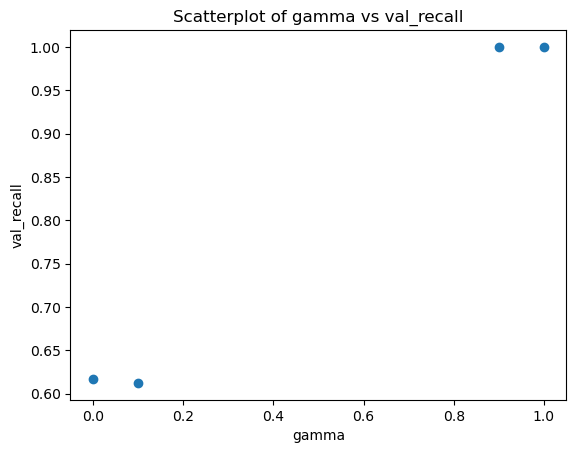

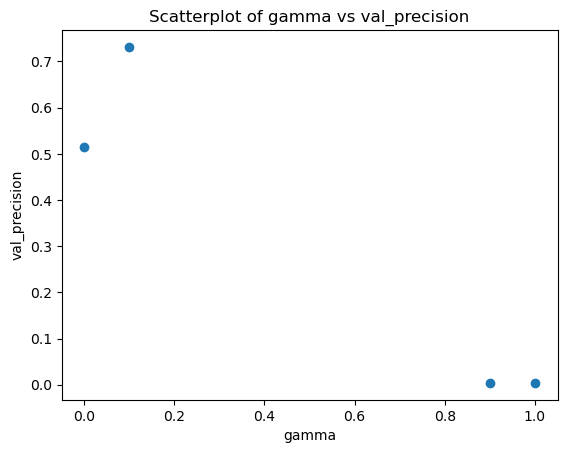

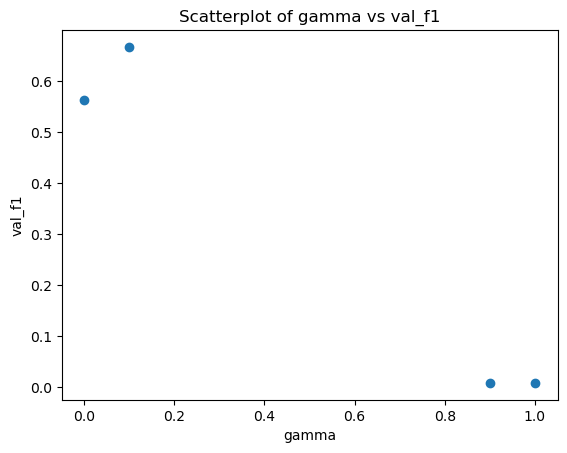

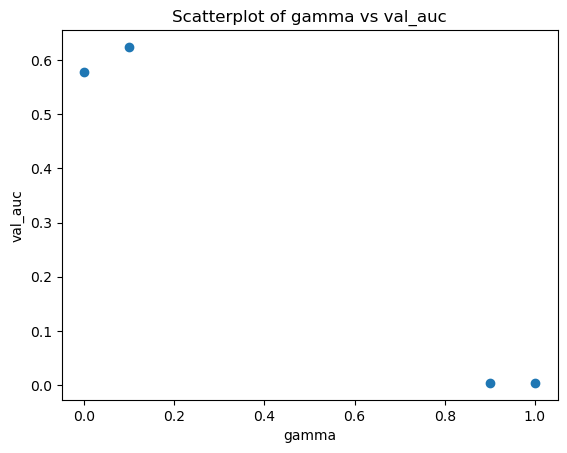

In [51]:
done_1 = []
kpis = ["gamma"]
metrics = ["val_recall", "val_precision", "val_f1", "val_auc"]
        

for col in kpis:
    
    for col_2 in kpis:
        for metric in metrics:
            plt.scatter(df_perf[col], df_perf[metric] )
            plt.title(f'Scatterplot of {col} vs {metric}')
            plt.xlabel(col)
            plt.ylabel(metric)
            plt.show()
            
            done_1.append(col)

In [52]:
df_perf = pd.read_csv("LSTM_validation_data_2.csv")
df_perf.columns

Index(['num_blocks_list', 'sequence_length', 'model_type', 'units', 'dropout',
       'learning_rate', 'batch_size', 'regularization', 'reg_strength',
       'class_weights', 'val_precision', 'val_recall', 'val_f1',
       'val_accuracy', 'val_auc'],
      dtype='object')

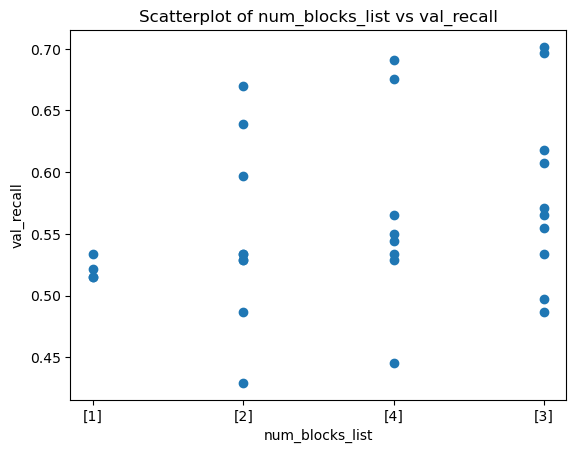

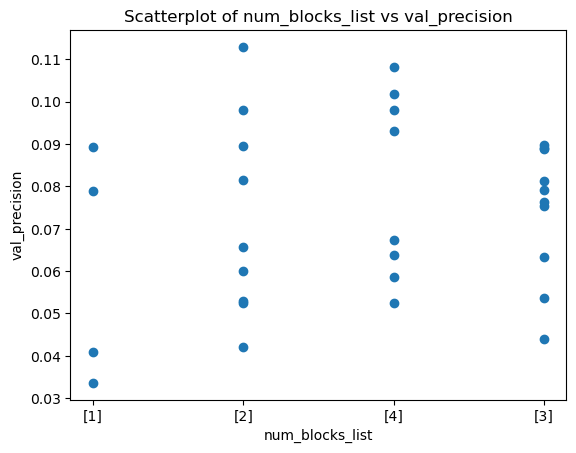

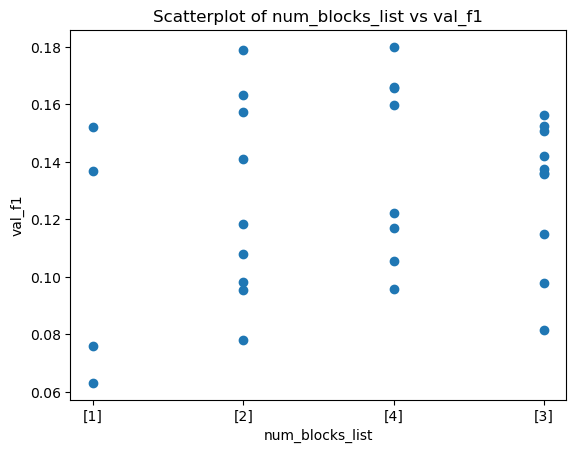

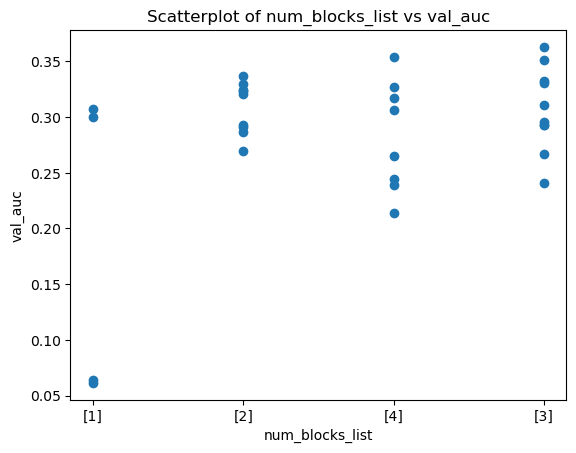

In [53]:
metrics = ["val_recall", "val_precision", "val_f1", "val_auc"]

import ast

hps = ["num_blocks_list"]

for metric in metrics:
    for hp in hps:

        plt.scatter(df_perf[hp], df_perf[metric] )
        plt.title(f'Scatterplot of {hp} vs {metric}')
        plt.xlabel(hp )
        plt.ylabel(metric)
        plt.show()

In [54]:
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import roc_auc_score
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l1, l2, l1_l2
from tensorflow.keras.callbacks import EarlyStopping
from tqdm import tqdm

# Define hyperparameters to tune
param_grid = {
    'units': [512, 128],
    'dropout': [0.0, 0.1],
    'learning_rate': [0.0001],
    'batch_size': [128, 512, 1024],
    'regularization': ['l1', 'l2'],
    'reg_strength': [0.0001],
    'num_blocks_list': [[1], [2], [3], [4]]  # Defines different numbers of LSTM layers
}

# Create combinations of hyperparameters
param_combinations = list(ParameterGrid(param_grid))

param_combinations

[{'batch_size': 128,
  'dropout': 0.0,
  'learning_rate': 0.0001,
  'num_blocks_list': [1],
  'reg_strength': 0.0001,
  'regularization': 'l1',
  'units': 512},
 {'batch_size': 128,
  'dropout': 0.0,
  'learning_rate': 0.0001,
  'num_blocks_list': [1],
  'reg_strength': 0.0001,
  'regularization': 'l1',
  'units': 128},
 {'batch_size': 128,
  'dropout': 0.0,
  'learning_rate': 0.0001,
  'num_blocks_list': [1],
  'reg_strength': 0.0001,
  'regularization': 'l2',
  'units': 512},
 {'batch_size': 128,
  'dropout': 0.0,
  'learning_rate': 0.0001,
  'num_blocks_list': [1],
  'reg_strength': 0.0001,
  'regularization': 'l2',
  'units': 128},
 {'batch_size': 128,
  'dropout': 0.0,
  'learning_rate': 0.0001,
  'num_blocks_list': [2],
  'reg_strength': 0.0001,
  'regularization': 'l1',
  'units': 512},
 {'batch_size': 128,
  'dropout': 0.0,
  'learning_rate': 0.0001,
  'num_blocks_list': [2],
  'reg_strength': 0.0001,
  'regularization': 'l1',
  'units': 128},
 {'batch_size': 128,
  'dropout': 

## Autoencoder Poor Performance Analysis 

In [55]:
#Load the datasets from CSV files
proc_train_data = pd.read_csv("proc_train_data.csv")
proc_val_data = pd.read_csv("proc_val_data.csv")
proc_test_data = pd.read_csv("proc_test_data.csv")

In [56]:
# import my custom function from utils notebook
import import_ipynb
import my_utils
import importlib
importlib.reload(my_utils)
from my_utils import *

final_train_data, final_validation_data, final_test_data = encode_and_scale(proc_train_data, proc_val_data, proc_test_data) 

# Split features and target
X_train = final_train_data.drop(['is_fraud', 'zip'], axis=1)
y_train = final_train_data['is_fraud']

X_val = final_validation_data.drop(['is_fraud', 'zip'], axis=1)
y_val = final_validation_data['is_fraud']

X_test = final_test_data.drop(['is_fraud', 'zip'], axis=1)
y_test = final_test_data['is_fraud']

## Address class imbalance with SMOTE
#smote = SMOTE(random_state=42)
#X_resampled, y_resampled = smote.fit_resample(X, y)

# Creating validation dataset with stratify strategy in order to keep the original labels proportion
#X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.15, random_state=42, stratify=y_train)


X_test = X_test[X_train.columns]
X_val = X_val[X_train.columns]

print("X_train shape: ", X_train.shape)
print("X_val shape: ", X_val.shape)
print("X_test shape: ", X_test.shape)

removing jobs missing in train dataset but existing in test dataset
Encode gender
Label Encoding
merchant
Fit on training data and get classes
Transform train_data
Transform validation_data
Transform test_data
category
Fit on training data and get classes
Transform train_data
Transform validation_data
Transform test_data
Scale continuous variables
fit_transform train_data
transform validation_data
transform test_data
X_train shape:  (280000, 16)
X_val shape:  (60000, 16)
X_test shape:  (60000, 16)


### Outlier Detection (Z-score, IQR, Isolation Forest)

In [57]:
proc_train_data.shape

(280000, 18)

In [58]:
import numpy as np
import pandas as pd
from scipy.stats import zscore
from sklearn.ensemble import IsolationForest

# Load dataset (replace with your dataset)
df = proc_train_data  # Load your data
features = df.select_dtypes(include=[np.number])  # Select numeric features

# Z-score method
z_scores = np.abs(zscore(features))
outliers_z = (z_scores > 3).sum().sum()  # Count of outliers with Z > 3
print(f"Outliers detected using Z-score: {outliers_z}")

# IQR method
Q1 = features.quantile(0.25)
Q3 = features.quantile(0.75)
IQR = Q3 - Q1
outliers_iqr = ((features < (Q1 - 1.5 * IQR)) | (features > (Q3 + 1.5 * IQR))).sum().sum()
print(f"Outliers detected using IQR: {outliers_iqr}")

# Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
outliers_iforest = iso_forest.fit_predict(features)
print(f"Outliers detected using Isolation Forest: {np.sum(outliers_iforest == -1)}")


Outliers detected using Z-score: 15937
Outliers detected using IQR: 195318


C:\Users\s.crispino\AppData\Local\anaconda3\lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected using Isolation Forest: 14000


## Autoencoder Reconstruction Error Analysis

X_train_no_fraud.shape : (278685, 16)


Hyperparameter Tuning:   0%|                                                                     | 0/1 [00:00<?, ?it/s]

Training with parameters: {'batch_size': 256, 'dropout': 0.0, 'encoding_dim': 8, 'l1_reg': 0.001, 'l2_reg': 0.0, 'learning_rate': 0.0001}

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 16)]              0         
                                                                 
 dense (Dense)               (None, 12)                204       
                                                                 
 batch_normalization (Batch  (None, 12)                48        
 Normalization)                                                  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 12)                0         
                                                                 
 dropout (Dropout)           (None, 12)                0         
                                                      

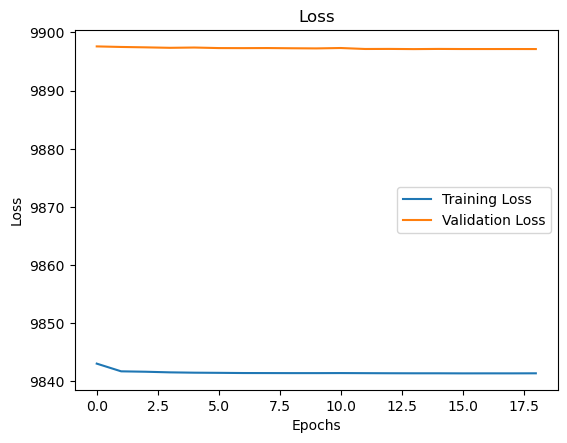

1868/1868 [==============================] - 3s 1ms/step


Hyperparameter Tuning: 100%|█████████████████████████████████████████████████████████████| 1/1 [01:24<00:00, 84.88s/it]

Validation MSE: 9897.1113
Best Hyperparameters: {'batch_size': 256, 'dropout': 0.0, 'encoding_dim': 8, 'l1_reg': 0.001, 'l2_reg': 0.0, 'learning_rate': 0.0001}
Best Validation MSE: 9897.1113


<Axes: title={'center': 'Autoencoder MSE vs Hyperparameter Configurations'}>

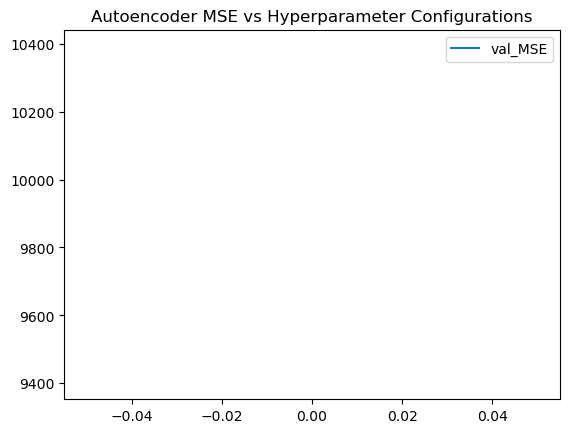

In [59]:
val_performance = {}
val_performance['hyperparams'] = []
val_performance['val_MSE'] = []

# Initialize variables to track the best model and parameters
best_model = None
best_params = None
best_val_mse = np.inf


from sklearn.metrics import mean_squared_error

# Removing Fraud 
X_train_no_fraud = X_train[y_train == 0]
X_val_no_fraud = X_val[y_val == 0]

print("X_train_no_fraud.shape :", X_train_no_fraud.shape)


# Define hyperparameters to tune
param_grid = {
    'encoding_dim': [8],
    'l1_reg': [0.001],#[0.0, 0.001, 0.0001], 
    'l2_reg': [0.0],#[0.0, 0.001, 0.0001], 
    'dropout': [0.0], #[0.0, 0.2, 0.3],
    'learning_rate': [0.0001],
    'batch_size': [256], #[64, 128, 256]
}

# (X_train, encoding_dim=6, activation='LeakyReLU', dropout_rate=0.2, learning_rate=0.0001):



# Create combinations of hyperparameters
param_combinations = list(ParameterGrid(param_grid))



with tqdm(total=len(param_combinations), desc="Hyperparameter Tuning") as pbar:
    # Iterate through all parameter combinations
    for params in param_combinations:
        print(f"Training with parameters: {params}")
        
        model, hyperparams = create_autoencoder(X_train_no_fraud, 
                                                      encoding_dim=params['encoding_dim'], 
                                                      activation='LeakyReLU', 
                                                      dropout_rate=params['dropout'],
                                                      learning_rate=params['learning_rate'],
                                                      l1=params['l1_reg'],
                                                      l2=params['l2_reg']
                                                     )
                                                      

        # Compile the autoencoder
        model.compile(optimizer='adam', loss='mse')

        # Early stopping to prevent overfitting
        # patience: Number of epochs with no improvement after which training will be stopped
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

        # Train the autoencoder
        history = model.fit(
            X_train_no_fraud, X_train_no_fraud,
            epochs=50,
            batch_size=params['batch_size'],
            shuffle=True,
            validation_data=(X_val_no_fraud, X_val_no_fraud),
            callbacks=[early_stopping]
        )


        plot_performance(history)
        # Evaluate MSE on the validation set
        y_val_pred = model.predict(X_val_no_fraud)
        val_mse = mean_squared_error(X_val_no_fraud, y_val_pred)
        print(f"Validation MSE: {val_mse:.4f}")
        val_performance['hyperparams'].append(hyperparams)
        val_performance['val_MSE'].append(val_mse)
        
        # Update the best model if the current one is better
        if val_mse < best_val_mse:
            best_val_mse = val_mse
            best_model = model
            best_params = params
        
        pbar.update(1)


# Output the best hyperparameters and validation AUC
print(f"Best Hyperparameters: {best_params}")
print(f"Best Validation MSE: {best_val_mse:.4f}")
pd.DataFrame(val_performance).plot(title='Autoencoder MSE vs Hyperparameter Configurations')        
        


1868/1868 [==============================] - 2s 1ms/step


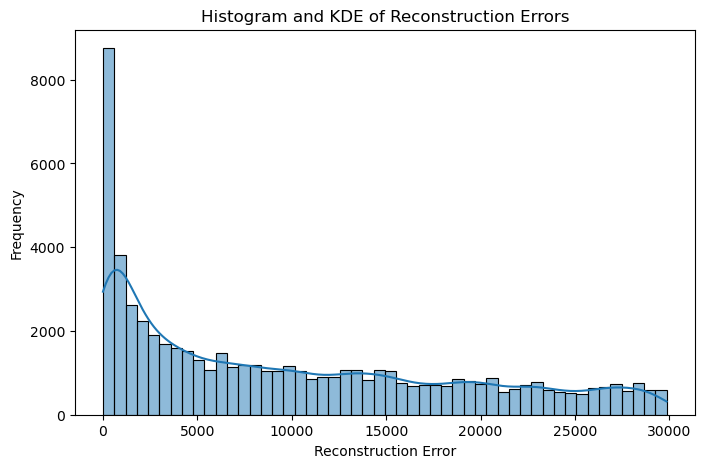

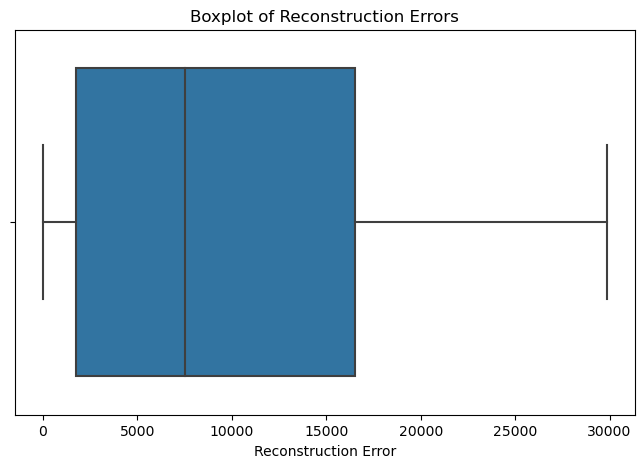

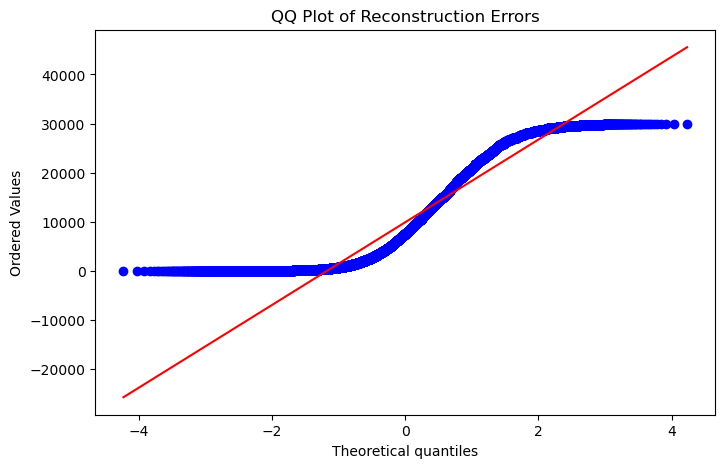

In [60]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats


reconstruction_errors = np.mean(np.square(X_val_no_fraud - best_model.predict(X_val_no_fraud)), axis=1)

# 1. Histogram + KDE Plot
plt.figure(figsize=(8, 5))
sns.histplot(reconstruction_errors, bins=50, kde=True)
plt.title("Histogram and KDE of Reconstruction Errors")
plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency")
plt.show()

# 2. Boxplot of Reconstruction Errors
plt.figure(figsize=(8, 5))
sns.boxplot(x=reconstruction_errors)
plt.title("Boxplot of Reconstruction Errors")
plt.xlabel("Reconstruction Error")
plt.show()

# 3. QQ Plot
plt.figure(figsize=(8, 5))
stats.probplot(reconstruction_errors, dist="norm", plot=plt)
plt.title("QQ Plot of Reconstruction Errors")
plt.show()


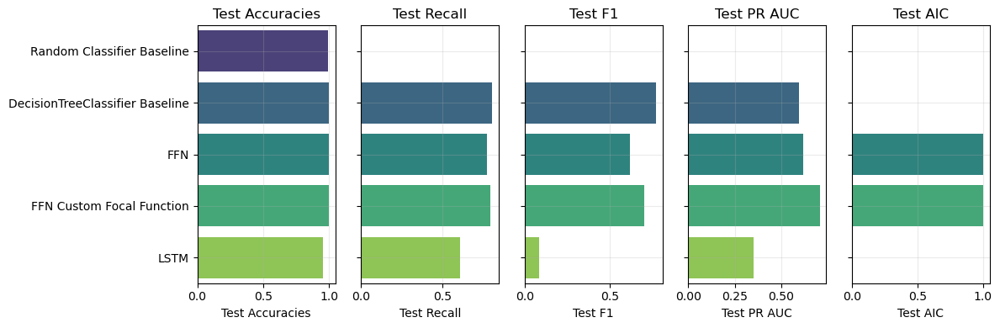

In [15]:
compare_test_performance("experiment_log_light_dataset_historical_features.csv")